In [1]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import HeatMap

In [2]:
from sklearn.preprocessing import LabelEncoder
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.preprocessing import OneHotEncoder

In [3]:
import sqlite3

In [4]:
conn = sqlite3.connect("accident_data_v1.0.0_2023.db")

In [5]:
cur = conn.cursor()

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
cur.execute("SELECT name FROM sqlite_master WHERE type='table';")

tables = cur.fetchall()
print (tables)
for table in tables:
    print(table[0])

[('accident',), ('casualty',), ('vehicle',), ('lsoa',)]
accident
casualty
vehicle
lsoa


In [8]:
accident_df= pd.read_sql('select * from  accident', conn)
accident_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2017010001708,2017,010001708,532920.0,196330.0,-0.080107,51.650061,1,1,2,...,0,4,1,1,0,0,1,1,2,E01001450
1,2017010009342,2017,010009342,526790.0,181970.0,-0.173845,51.522425,1,3,2,...,0,4,1,2,0,0,1,1,2,E01004702
2,2017010009344,2017,010009344,535200.0,181260.0,-0.052969,51.514096,1,3,3,...,0,4,1,1,0,0,1,1,2,E01004298
3,2017010009348,2017,010009348,534340.0,193560.0,-0.060658,51.624832,1,3,2,...,4,4,2,2,0,0,1,1,2,E01001429
4,2017010009350,2017,010009350,533680.0,187820.0,-0.072372,51.573408,1,2,1,...,5,4,1,2,0,0,1,1,2,E01001808


In [9]:
casualty_df= pd.read_sql('select * from  casualty', conn)
casualty_df.head()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,0,2017010001708,2017,010001708,1,1,2,2,18,4,3,0,0,1,0,0,9,1,2
1,1,2017010001708,2017,010001708,2,2,1,1,19,4,2,0,0,0,0,0,2,-1,-1
2,2,2017010001708,2017,010001708,2,3,2,1,18,4,1,0,0,0,0,0,2,-1,-1
3,3,2017010009342,2017,010009342,1,1,2,2,33,6,3,0,0,1,0,0,9,1,5
4,4,2017010009344,2017,010009344,3,1,1,2,31,6,3,0,0,0,0,0,9,1,5


In [10]:
vehicle_df= pd.read_sql('select * from  vehicle', conn)
vehicle_df.head()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,0,2017010001708,2017,010001708,1,9,0,18,1,5,...,6,1,24,5,1997,2,1,-1,-1,-1
1,1,2017010001708,2017,010001708,2,2,0,18,1,5,...,6,1,19,4,-1,-1,-1,-1,-1,-1
2,2,2017010009342,2017,010009342,1,9,0,18,5,1,...,6,1,33,6,1797,8,8,-1,9,1
3,3,2017010009342,2017,010009342,2,9,0,18,5,1,...,6,1,40,7,2204,2,12,-1,2,1
4,4,2017010009344,2017,010009344,1,9,0,18,3,7,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1


In [11]:
lsoa_df= pd.read_sql('select * from  lsoa', conn)
lsoa_df.head()

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311



Rerun the commands for finding the column names and save the results in a
variable. Using a loop or a list comprehension, convert these variables into a
separate list of column names for each table.

In [12]:
# Extract column names from the fetched information
col_info_accident = cur.execute ('PRAGMA table_info(accident)')
col_info_accident = cur.fetchall()
column_names_accident = [col[1] for col in col_info_accident]

# casualty table:
cur.execute('PRAGMA table_info(casualty)')
col_info_casualty = cur.fetchall()
column_names_casualty = [col[1] for col in col_info_casualty]

# vehicle table:
cur.execute('PRAGMA table_info(vehicle)')
col_info_vehicle = cur.fetchall()
column_names_vehicle = [col[1] for col in col_info_vehicle]

# the lsoa table:
cur.execute('PRAGMA table_info(lsoa)')
col_info_lsoa = cur.fetchall()
column_names_lsoa = [col[1] for col in col_info_lsoa]

#lists of column names for each table
print("Column names for the accident table:", column_names_accident)
print('')
print("Column names for the casualty table:", column_names_casualty)
print('')
print("Column names for the vehicle table:", column_names_vehicle)
print('')
print("Column names for the lsoa table:", column_names_lsoa)

Column names for the accident table: ['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']

Column names for the casualty table: ['casualty_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference', 

In [13]:
# Define a function to get the row count for a table
def get_row_count(table_name):
    cur.execute(f"SELECT COUNT(*) FROM {table_name}")
    count = cur.fetchone()[0]
    return count

# List of tables in the database
tables = ["accident", "vehicle", "casualty", "lsoa"]

# Get row count for each table
for table in tables:
    count = get_row_count(table)
    print(f"Number of rows in {table} table: {count}")

Number of rows in accident table: 461352
Number of rows in vehicle table: 849091
Number of rows in casualty table: 600332
Number of rows in lsoa table: 34378


In [14]:
def get_primary_keys(table_name):
  """Retrieves primary key information for a specific table"""
  results = cur.execute(f"PRAGMA table_info('{table_name}')").fetchall()
  primary_keys = [row[1] for row in results if row[5] == 1]
  return primary_keys

def get_foreign_keys(table_name):
  """Retrieves foreign key information for a specific table"""
  results = cur.execute(f"PRAGMA foreign_key_list('{table_name}')").fetchall()

  foreign_keys = []
  for row in results:
    foreign_keys.append({
      'id': row[0],
      'referenced_table': row[2],
      'from_column': row[3],
      'to_column': row[4]
    })
  return foreign_keys

accident_pks = get_primary_keys('accident')
casualty_pks = get_primary_keys('casualty')
vehicle_pks = get_primary_keys('vehicle')
lsoa_pks = get_primary_keys('lsoa')

accident_fks = get_foreign_keys('accident')
casualty_fks = get_foreign_keys('casualty')
vehicle_fks = get_foreign_keys('vehicle')
lsoa_fks = get_foreign_keys('lsoa')

print("Primary keys for the accident table:", accident_pks)
print("Primary keys for the casualty table:", casualty_pks)
print("Primary keys for the vehicle table:", vehicle_pks)
print("Primary keys for the lsoa table:", lsoa_pks)

print("Foreign Keys for the accident table:", accident_fks)
print("Foreign keys for the casualty table:", casualty_fks)
print("Foreign keys for the vehicle table:", vehicle_fks)
print("Foreign keys for the lsoa table:", lsoa_fks)

Primary keys for the accident table: ['accident_index']
Primary keys for the casualty table: ['casualty_index']
Primary keys for the vehicle table: ['vehicle_index']
Primary keys for the lsoa table: ['objectid']
Foreign Keys for the accident table: []
Foreign keys for the casualty table: [{'id': 0, 'referenced_table': 'accident', 'from_column': 'accident_index', 'to_column': 'accident_index'}]
Foreign keys for the vehicle table: [{'id': 0, 'referenced_table': 'accident', 'from_column': 'accident_index', 'to_column': 'accident_index'}]
Foreign keys for the lsoa table: []


#### Join the tables Using Left Join

In [15]:
# Define SQL query and fetch combined data
combined_data = cur.execute("""
SELECT 
    accident.*, 
    vehicle.vehicle_index, vehicle.vehicle_type, vehicle.towing_and_articulation, vehicle.vehicle_manoeuvre, 
    vehicle.vehicle_direction_from, vehicle.vehicle_direction_to, vehicle.vehicle_location_restricted_lane, 
    vehicle.junction_location, vehicle.skidding_and_overturning, vehicle.hit_object_in_carriageway, 
    vehicle.vehicle_leaving_carriageway, vehicle.hit_object_off_carriageway, vehicle.first_point_of_impact,
    vehicle.vehicle_left_hand_drive, vehicle.journey_purpose_of_driver, vehicle.sex_of_driver, vehicle.age_of_driver, 
    vehicle.age_band_of_driver, vehicle.engine_capacity_cc, vehicle.propulsion_code, vehicle.age_of_vehicle, 
    vehicle.generic_make_model, vehicle.driver_imd_decile, vehicle.driver_home_area_type,
    casualty.casualty_index, casualty.vehicle_reference, casualty.casualty_reference, casualty.casualty_class, casualty.sex_of_casualty, 
    casualty.age_of_casualty, casualty.age_band_of_casualty, casualty.casualty_severity, casualty.pedestrian_location, 
    casualty.pedestrian_movement, casualty.car_passenger, casualty.bus_or_coach_passenger, casualty.pedestrian_road_maintenance_worker, 
    casualty.casualty_type, casualty.casualty_home_area_type, casualty.casualty_imd_decile,
    lsoa.*
FROM 
    accident 
LEFT JOIN 
    vehicle ON vehicle.accident_index = accident.accident_index 
LEFT JOIN 
    casualty ON casualty.accident_index = accident.accident_index
LEFT JOIN 
    lsoa ON lsoa.lsoa01cd = accident.lsoa_of_accident_location
WHERE 
    accident.accident_year = 2020
""").fetchall()

# Fetch the column names
column_names = [description[0] for description in cur.description]

# Print the column names
print("Column Names:", column_names)

# Fetch and print the limited number of rows with row headers
for idx, row in enumerate(combined_data[:5]):  # Limit to 5 rows
    print(f"Row {idx + 1}: {row}")

Column Names: ['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location', 'vehicle_index', 'vehicle_type', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to', 'vehicle_location_restricted_lane', 'junction_loc

In [16]:
combined_df = pd.DataFrame(combined_data, columns=column_names)

In [17]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220435 entries, 0 to 220434
Data columns (total 83 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               220435 non-null  object 
 1   accident_year                                220435 non-null  int64  
 2   accident_reference                           220435 non-null  object 
 3   location_easting_osgr                        220401 non-null  float64
 4   location_northing_osgr                       220401 non-null  float64
 5   longitude                                    220401 non-null  float64
 6   latitude                                     220401 non-null  float64
 7   police_force                                 220435 non-null  int64  
 8   accident_severity                            220435 non-null  int64  
 9   number_of_vehicles                           220435 non-nul

In [18]:
len(column_names)

83

### Data Cleaning

#### Null Entries

In [19]:
# Extracting columns with NaN
columns_with_nan = combined_df.columns[combined_df.isna().any()].tolist()
columns_with_nan_df = combined_df[columns_with_nan]

# Checking the sum of NaN entries in each column
nan_sum_per_column = columns_with_nan_df.isna().sum()
print("Sum of NaN entries per column:")
print(nan_sum_per_column)

Sum of NaN entries per column:
location_easting_osgr        34
location_northing_osgr       34
longitude                    34
latitude                     34
objectid                  18492
lsoa01cd                  18492
lsoa01nm                  18492
lsoa01nmw                 18492
shape__area               18492
shape__length             18492
globalid                  18492
dtype: int64


In [20]:
def extract_null_values_with_info(df):
    columns_to_check = ['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']
    columns_to_include = ['accident_reference', 'accident_index', 'police_force', 'local_authority_ons_district', 
                          'local_authority_district', 'lsoa_of_accident_location']
    
    null_rows = df[df[columns_to_check].isnull().any(axis=1)]
    null_rows_with_info = null_rows[columns_to_include + columns_to_check]
    
    return null_rows_with_info

# Call the function to extract null value rows with additional information
null_value_rows_with_info = extract_null_values_with_info(combined_df)

# Display the extracted null value rows with additional information
null_value_rows_with_info.head()

,accident_reference,accident_index,police_force,local_authority_ons_district,local_authority_district,lsoa_of_accident_location,location_easting_osgr,location_northing_osgr,longitude,latitude
57197,052002442,2020052002442,5,E08000013,92,-1,NaN,NaN,NaN,NaN
57198,052002442,2020052002442,5,E08000013,92,-1,NaN,NaN,NaN,NaN
67235,070769852,2020070769852,7,E06000050,130,-1,NaN,NaN,NaN,NaN
67236,070769852,2020070769852,7,E06000050,130,-1,NaN,NaN,NaN,NaN
74986,122001194,2020122001194,12,E07000164,181,-1,NaN,NaN,NaN,NaN


In [21]:
def get_other_data_same_district(df):
    # Filter the DataFrame for rows where location entries are empty
    location_null = df[(df['location_easting_osgr'].isna()) | 
                       (df['location_northing_osgr'].isna()) | 
                       (df['longitude'].isna()) | 
                       (df['latitude'].isna())]
    
    # Get the unique local_authority_ons_district values from the rows with missing location entries
    districts_with_null_location = location_null['local_authority_ons_district'].unique()
    
    # Filter the DataFrame for rows with the same local_authority_ons_district values
    other_data_same_district = df[df['local_authority_ons_district'].isin(districts_with_null_location)]
    
    # Limit the output columns
    output_columns = ['accident_reference', 'accident_index', 'police_force', 
                      'local_authority_ons_district', 'local_authority_district', 
                      'lsoa_of_accident_location', 'location_easting_osgr', 
                      'location_northing_osgr', 'longitude', 'latitude']
    
    # Return the filtered DataFrame with limited columns
    return other_data_same_district[output_columns]

# Call the function with the combined DataFrame
other_data_same_district = get_other_data_same_district(combined_df)

# Print out the filtered DataFrame
other_data_same_district

,accident_reference,accident_index,police_force,local_authority_ons_district,local_authority_district,lsoa_of_accident_location,location_easting_osgr,location_northing_osgr,longitude,latitude
53541,050080223,2020050080223,5,E08000013,-1,E01006898,352108.0,390290.0,-2.721876,53.407256
53542,050080223,2020050080223,5,E08000013,-1,E01006898,352108.0,390290.0,-2.721876,53.407256
53546,050702981,2020050702981,5,E08000013,-1,E01006889,350529.0,389736.0,-2.745539,53.402131
53547,050702981,2020050702981,5,E08000013,-1,E01006889,350529.0,389736.0,-2.745539,53.402131
53548,050702981,2020050702981,5,E08000013,-1,E01006889,350529.0,389736.0,-2.745539,53.402131
...,...,...,...,...,...,...,...,...,...,...
211469,63DF01620,202063DF01620,63,W06000023,753,W01000484,324280.0,259980.0,-3.110141,52.232798
211470,63DF01620,202063DF01620,63,W06000023,753,W01000484,324280.0,259980.0,-3.110141,52.232798
211471,63DF01620,202063DF01620,63,W06000023,753,W01000484,324280.0,259980.0,-3.110141,52.232798
211472,63DF01620,202063DF01620,63,W06000023,753,W01000484,324280.0,259980.0,-3.110141,52.232798


In [22]:
def replace_null_with_same_district_entries(df):
    # Group the DataFrame by 'local_authority_ons_district' and forward fill the null values
    df_filled = df.groupby('local_authority_ons_district', group_keys=False).apply(lambda x: x.ffill().bfill())
    
    return df_filled


# Call the function to replace null entries
combined_df = replace_null_with_same_district_entries(combined_df)

In [23]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 220435 entries, 0 to 220434
Data columns (total 83 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               220435 non-null  object 
 1   accident_year                                220435 non-null  int64  
 2   accident_reference                           220435 non-null  object 
 3   location_easting_osgr                        220435 non-null  float64
 4   location_northing_osgr                       220435 non-null  float64
 5   longitude                                    220435 non-null  float64
 6   latitude                                     220435 non-null  float64
 7   police_force                                 220435 non-null  int64  
 8   accident_severity                            220435 non-null  int64  
 9   number_of_vehicles                           220435 non-null  in

#### Negative Value

In [24]:
neg_counts = (combined_df == -1).sum()

# Calculate percentages of negative values for each column
neg_counts_percentages = (neg_counts / len(combined_df)) * 100

# Sort neg_counts_percentages
neg_counts_percentages_sorted = neg_counts_percentages.sort_values(ascending=False)

neg_counts_percentages_sorted

junction_control             42.516388
second_road_number           42.242838
engine_capacity_cc           23.214099
age_of_vehicle               22.891102
propulsion_code              22.858893
                               ...    
urban_or_rural_area           0.000000
lsoa_of_accident_location     0.000000
vehicle_index                 0.000000
vehicle_type                  0.000000
globalid                      0.000000
Length: 83, dtype: float64

In [25]:
def sort_negative_entries(df):
    # Calculate the count of negative entries in each column
    neg_counts = (df == -1).sum()
    
    # Sort the count of negative entries per column
    neg_counts_sorted = neg_counts.sort_values(ascending=False)
    
    # Print the sorted count of negative entries per column
    print("Sorted count of negative entries per column:")
    return neg_counts_sorted

# Call the function with the combined DataFrame
sorted_neg_entries = sort_negative_entries(combined_df)

# Print the first 46 rows
print(sorted_neg_entries.head(46))

Sorted count of negative entries per column:
junction_control                               93721
second_road_number                             93118
engine_capacity_cc                             51172
age_of_vehicle                                 50460
propulsion_code                                50389
driver_imd_decile                              38272
driver_home_area_type                          37985
age_band_of_driver                             27373
age_of_driver                                  27373
casualty_imd_decile                            20559
casualty_home_area_type                        20270
trunk_road_flag                                15810
age_band_of_casualty                            4654
age_of_casualty                                 4654
local_authority_district                        2345
vehicle_direction_to                            1979
vehicle_direction_from                          1962
sex_of_casualty                                 1393
f

#### Creating hour column
Extract the hour and minute from the 'time' column

In [26]:
combined_df['hour'] = combined_df['time'].str.split(':').str[0].astype(int)
combined_df['minute'] = combined_df['time'].str.split(':').str[1].astype(int)

# Drop the original 'time' column
combined_df.drop(columns=['time'], inplace=True)

In [27]:
combined_df['engine_capacity_cc'].unique()

array([ 1968,  1395,    -1,  1798,  2993,  1390,  1969,  2143,  1984,
         114,  1600,  4134,  1986,  1597,  1229,  2926,  1242,  1840,
        1339,  1797,   998,  1296,  1988,   125,  5132,  2987,  1386,
        1299,  1398,  2360, 10837,  1998,   999,  1461,   898,  1596,
        1329,  1364,  1598,  2720,  2287,  1388,  4500,  2198,  1560,
        2979,  2179,  1499,  1197,  4760,  1950,  1498,  1796,  2295,
         108,   973,  1595,  2362,  1328,  1997,  2199,   600,  1580,
        6696,    49,  1599,  1995,  2499,    48,   124,  1910,  1349,
        2967,  1399,  1084, 12742,   689,  1490,  1380,  4461,  1896,
        6700,  1497,   799,  2188,  3799,   875,  2148,  6592,  1368,
        1332, 10667,  3311,  1360,  1991,  1397,  1496,  1591,  1956,
        2298,  2891,  1618,  1200,  1794,  6692,  1198,  1587,   647,
        1396,  1240,  4009,   865,  1248,  1124,   847,  2204,  2191,
         693,  1781,   278,   929,  1149,  1348,  2981,  2996,  1790,
       12777,  1799,

#### Cleaning 
Numerical data: engine_capacity_cc, speed_limit, age_of_driver, age_of_casualty

Identify Negative Entries: Create masks for each column (speed_limit, age_of_casualty, age_of_vehicle) to identify rows with negative entries.

Combine Masks: Combine the masks using logical OR to create an overall negative mask. 

Iterate Over Negative Entries: Iterate over each row with a negative entry based on the negative mask.

Find Similar Rows: Extract relevant characteristics (local_authority_ons_district and hour) from the current row. Use these characteristics to find similar rows in the dataset.

Calculate Median: Calculate the median values for the columns (speed_limit, age_of_casualty, age_of_vehicle) from the similar rows.

Replace Negative Entries: Replace the negative entries in the current row with the calculated median values.

Handle Missing Median:If no similar rows are found, calculate the overall median of the columns and use it as the default median.

In [28]:
def clean_negative_entry(data):
    # Create masks for each column with negative entries
    negative_speed_limit_mask = data['speed_limit'] < 0
    negative_age_of_casualty_mask = data['age_of_casualty'] < 0
    negative_age_of_vehicle_mask = data['age_of_vehicle'] < 0

    # Combine the masks using logical OR
    negative_mask = negative_speed_limit_mask | negative_age_of_casualty_mask | negative_age_of_vehicle_mask

    # Iterate over each row with a negative entry
    for index, row in data[negative_mask].iterrows():
        # Extract relevant characteristics for median calculation
        characteristics = ['local_authority_ons_district', 'hour']
        similar_rows_mask = (data[characteristics] == row[characteristics]).all(axis=1)

        # Calculate the median score for similar rows
        median_data_score = data[similar_rows_mask][[ 'speed_limit', 'age_of_casualty', 'age_of_vehicle']].median()

        # If no similar rows found, use overall median as default
        if np.any(np.isnan(median_data_score)):
            median_data_score = data[['speed_limit', 'age_of_casualty', 'age_of_vehicle']].median()

        # Round median values to the nearest integer and cast to integers
        median_data_score = np.round(median_data_score).astype(int)

        # Replace negative entries with the calculated median using .loc
        data.loc[index, ['speed_limit', 'age_of_casualty', 'age_of_vehicle']] = median_data_score
    
    # Return the modified DataFrame
    return data

# Call the function to replace negative entries
combined_df = clean_negative_entry(combined_df)

Categorical data: vehicle_direction_to, vehicle_direction_from, light_conditions, road_surface_conditions, weather_conditions, junction_detail

Create Masks for Negative category Entries: Masks are created for each categorical column with negative entries

Combine Masks Using Logical OR: Masks for each categorical column with negative entries are combined using logical OR to create an overall negative mask.

Iterate Over Rows with Negative Entries: For each row identified by the negative mask, iterate over the rows with negative entries.

Extract Relevant Characteristics for Mode Calculation: Extract relevant characteristics like local_authority_ons_district and hour for mode calculation.

Calculate Mode Value for Similar Rows: Calculate the mode value for similar rows in the categorical columns.

Handle Cases Where Similar Rows Still Have Negative Values: If similar rows still contain negative values or if the mode calculation returns NaN values, use the overall mode as a default.

Replace Negative Entries with Mode Values: Replace the negative entries with the calculated mode values using .loc.

In [29]:
def clean_negative_cat_entry(data):
    # Create masks for each column with negative entries
    negative_vehicle_direction_to_mask = data['vehicle_direction_to'] < 0
    negative_vehicle_direction_from_mask = data['vehicle_direction_from'] < 0
    negative_light_conditions_mask = data['light_conditions'] < 0
    negative_road_surface_conditions_mask = data['road_surface_conditions'] < 0
    negative_weather_conditions_mask = data['weather_conditions'] < 0
    negative_junction_detail_mask = data['junction_detail'] < 0
    negative_pedestrian_location_mask = data['pedestrian_location'] < 0
    negative_pedestrian_movement_mask = data['pedestrian_movement'] < 0
    negative_pedestrian_crossing_human_control_mask = data['pedestrian_crossing_human_control'] < 0
    negative_pedestrian_crossing_physical_facilities_mask = data['pedestrian_crossing_physical_facilities'] < 0

    # Combine the masks using logical OR
    negative_mask = (negative_vehicle_direction_to_mask | negative_vehicle_direction_from_mask |
                     negative_light_conditions_mask | negative_road_surface_conditions_mask |
                     negative_weather_conditions_mask | negative_junction_detail_mask |
                     negative_pedestrian_location_mask | negative_pedestrian_movement_mask |
                     negative_pedestrian_crossing_human_control_mask |
                     negative_pedestrian_crossing_physical_facilities_mask)

    # Iterate over each row with a negative entry
    for index, row in data[negative_mask].iterrows():
        # Extract relevant characteristics for mode calculation
        characteristics = ['local_authority_ons_district', 'hour']
        similar_rows_mask = (data[characteristics] == row[characteristics]).all(axis=1)

        # Calculate the mode value for similar rows
        mode_data_score = data[similar_rows_mask][['vehicle_direction_to', 'vehicle_direction_from', 
                                                    'light_conditions', 'road_surface_conditions',
                                                    'weather_conditions', 'junction_detail',
                                                    'pedestrian_location', 'pedestrian_movement',
                                                    'pedestrian_crossing_human_control',
                                                    'pedestrian_crossing_physical_facilities']].mode().iloc[0]

        # If similar rows still have negative values, use overall mode as default
        if mode_data_score.isna().any() or (mode_data_score == -1).any():
            mode_data_score = data[['vehicle_direction_to', 'vehicle_direction_from', 
                                    'light_conditions', 'road_surface_conditions',
                                    'weather_conditions', 'junction_detail',
                                    'pedestrian_location', 'pedestrian_movement',
                                    'pedestrian_crossing_human_control',
                                    'pedestrian_crossing_physical_facilities']].mode().iloc[0]

        # Replace negative entries with the calculated mode using .loc
        data.loc[index, ['vehicle_direction_to', 'vehicle_direction_from', 'light_conditions', 
                         'road_surface_conditions', 'weather_conditions', 'junction_detail',
                         'pedestrian_location', 'pedestrian_movement',
                         'pedestrian_crossing_human_control',
                         'pedestrian_crossing_physical_facilities']] = mode_data_score
    
    # Return the modified DataFrame
    return data

# Call the function to replace negative entries with mode values
combined_df = clean_negative_cat_entry(combined_df)

In [30]:
# Function to round 'speed_limit' to the nearest 10 and the rest of the columns to the nearest integer
def round_values(data):
    # Round 'speed_limit' to the nearest 10
    data['speed_limit'] = (np.round(data['speed_limit'] / 10) * 10).astype(int)    
    return data

# Call the function to round values in the DataFrame
combined_df = round_values(combined_df)

In [31]:
negative_age= combined_df[combined_df['age_of_driver'] == -1]
negative_age

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,casualty_imd_decile,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid,hour,minute
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,3,4726.0,E01004726,Westminster 003C,Westminster 003C,185726.854301,2698.692831,e5cccc5e-7d0c-4f89-82c3-2a5d03b1ae18,1,25
13,2020010228018,2020,010228018,530876.0,191335.0,-0.111500,51.605653,1,3,2,...,6,2102.0,E01002102,Haringey 007C,Haringey 007C,318394.795540,4042.042434,31a03623-6bd6-4524-887b-f55d022f497e,4,0
16,2020010228022,2020,010228022,542576.0,167312.0,0.047641,51.386950,1,3,1,...,-1,662.0,E01000662,Bromley 026B,Bromley 026B,523692.839294,4623.732394,d032e1b9-7c81-4848-809f-992c3e26b1a0,4,0
31,2020010228031,2020,010228031,553943.0,190802.0,0.221108,51.595036,1,3,2,...,2,2293.0,E01002293,Havering 007A,Havering 007A,687690.044136,6478.694824,fe48a9fb-3ca9-464e-8d74-dbbbe15e26fb,4,46
32,2020010228031,2020,010228031,553943.0,190802.0,0.221108,51.595036,1,3,2,...,1,2293.0,E01002293,Havering 007A,Havering 007A,687690.044136,6478.694824,fe48a9fb-3ca9-464e-8d74-dbbbe15e26fb,4,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220259,2020991010956,2020,991010956,276445.0,651378.0,-3.969516,55.739972,99,3,2,...,1,NaN,None,None,None,NaN,NaN,None,13,45
220332,2020991012311,2020,991012311,311646.0,683727.0,-3.419652,56.038240,99,2,2,...,5,NaN,None,None,None,NaN,NaN,None,17,55
220385,2020991016099,2020,991016099,335343.0,731133.0,-3.051014,56.467865,99,3,4,...,4,NaN,None,None,None,NaN,NaN,None,21,7
220386,2020991016099,2020,991016099,335343.0,731133.0,-3.051014,56.467865,99,3,4,...,4,NaN,None,None,None,NaN,NaN,None,21,7


In [32]:
negative_age_counts = combined_df[combined_df['age_of_driver'] == -1].groupby('vehicle_type').size()
negative_age_counts

vehicle_type
1       628
2        94
3       357
4        83
5       101
8       549
9     21329
10       47
11      265
16        4
17       58
18        3
19     2294
20      218
21      280
22       18
23       10
90      361
97      185
98      489
dtype: int64

In [33]:
combined_df['vehicle_type'].unique()

array([ 9,  8,  3,  2, 11,  1, 90, 19,  4,  5, 21, 97, 20, 98, 10, 17, 23,
       22, 18, 16], dtype=int64)

###### Extract for the below clause:
Vehicle Type is coded 02 - 05, 08 - 11, 17 - 21, 23, 97 or 98 then the local processing authority should query the driver age if this is under 16.

In [34]:
# Define the list of vehicle types
vehicle_types_filter = [2, 3, 4, 5, 8, 9, 10, 11, 17, 18, 20, 21, 23, 97, 98]

below_age = combined_df[(combined_df['age_of_driver'] < 17) & (combined_df['vehicle_type'].isin(vehicle_types_filter))]
below_age

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,casualty_imd_decile,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid,hour,minute
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,3,4726.0,E01004726,Westminster 003C,Westminster 003C,185726.854301,2698.692831,e5cccc5e-7d0c-4f89-82c3-2a5d03b1ae18,1,25
13,2020010228018,2020,010228018,530876.0,191335.0,-0.111500,51.605653,1,3,2,...,6,2102.0,E01002102,Haringey 007C,Haringey 007C,318394.795540,4042.042434,31a03623-6bd6-4524-887b-f55d022f497e,4,0
16,2020010228022,2020,010228022,542576.0,167312.0,0.047641,51.386950,1,3,1,...,-1,662.0,E01000662,Bromley 026B,Bromley 026B,523692.839294,4623.732394,d032e1b9-7c81-4848-809f-992c3e26b1a0,4,0
31,2020010228031,2020,010228031,553943.0,190802.0,0.221108,51.595036,1,3,2,...,2,2293.0,E01002293,Havering 007A,Havering 007A,687690.044136,6478.694824,fe48a9fb-3ca9-464e-8d74-dbbbe15e26fb,4,46
32,2020010228031,2020,010228031,553943.0,190802.0,0.221108,51.595036,1,3,2,...,1,2293.0,E01002293,Havering 007A,Havering 007A,687690.044136,6478.694824,fe48a9fb-3ca9-464e-8d74-dbbbe15e26fb,4,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220187,2020991010173,2020,991010173,226451.0,642137.0,-4.759061,55.641702,99,2,4,...,2,NaN,None,None,None,NaN,NaN,None,2,5
220188,2020991010173,2020,991010173,226451.0,642137.0,-4.759061,55.641702,99,2,4,...,2,NaN,None,None,None,NaN,NaN,None,2,5
220385,2020991016099,2020,991016099,335343.0,731133.0,-3.051014,56.467865,99,3,4,...,4,NaN,None,None,None,NaN,NaN,None,21,7
220386,2020991016099,2020,991016099,335343.0,731133.0,-3.051014,56.467865,99,3,4,...,4,NaN,None,None,None,NaN,NaN,None,21,7


In [35]:
# Filter the DataFrame to include only rows where 'vehicle_type' is in vehicle_types_filter
filtered_age = combined_df[combined_df['vehicle_type'].isin(vehicle_types_filter)]

# Display the resulting DataFrame
filtered_age[['age_of_driver', 'vehicle_type']]

,age_of_driver,vehicle_type
0,32,9
1,45,9
2,45,9
3,-1,9
4,44,8
...,...,...
220429,39,9
220430,57,9
220431,38,5
220432,68,9


In [36]:
below_age['age_of_driver'].unique()

array([-1, 16, 14, 15, 13, 12,  5, 11,  8], dtype=int64)

In [37]:
# Get the count for each 'vehicle_type'
count_by_vehicle_type = below_age.groupby('vehicle_type').size()
print(count_by_vehicle_type)

vehicle_type
2       357
3       433
4        97
5       105
8       549
9     21472
10       47
11      267
17       64
18        3
20      218
21      280
23       20
97      225
98      491
dtype: int64


Group by 'vehicle_type' and Calculate Mean Age: Group the DataFrame by the 'vehicle_type' column and calculate the mean age for each group.
                                                                                                                        
Filter Rows with Negative Age: Identify rows with negative age entries by filtering the DataFrame where the 'age_of_driver' column is less than 0.

Replace Negative Ages with Mean Age by Vehicle Type: For each row with a negative age, retrieve the corresponding vehicle type and find the mean age for that vehicle type from the previously calculated mean age by vehicle type. If a mean age exists for the vehicle type, replace the negative age with the mean age.

In [38]:
def clean_negative_age1(df):
    # Group the DataFrame by 'vehicle_type' and calculate the mean age for each group
    mean_age_by_vehicle_type = df.groupby('vehicle_type')['age_of_driver'].mean().astype(int)
    
    # Filter rows with negative age
    negative_age_rows = df[df['age_of_driver'] < 0]
    
    # Replace negative ages with the mean age for their respective vehicle types
    for index, row in negative_age_rows.iterrows():
        vehicle_type = row['vehicle_type']
        mean_age = mean_age_by_vehicle_type.get(vehicle_type, None)
        if mean_age is not None:
            df.at[index, 'age_of_driver'] = mean_age
    
    return df

# Apply the cleaning function to the combined_df DataFrame
combined_df = clean_negative_age1(combined_df)

Calculate Mean Age: Calculate the mean age of all entries in the 'age_of_casualty' and 'age_of_vehicle' columns.

Filter Rows with Negative Age: Identify rows with negative age entries in both the 'age_of_casualty' and 'age_of_vehicle' columns by filtering the DataFrame where these columns are less than 0.

Replace Negative Ages with Mean Age: For each row with a negative age in the 'age_of_casualty' column, replace the negative age with the mean age of casualties. Similarly, for each row with a negative age in the 'age_of_vehicle' column, replace the negative age with the mean age of vehicles.

In [39]:
def clean_negative_age2(df):
    # Calculate the mean age of all 'age_of_casualty'
    mean_age_of_casualty = df['age_of_casualty'].mean().astype(int)
    mean_age_of_vehicle = df['age_of_vehicle'].mean().astype(int)
    
    # Filter rows with negative age
    negative_age_rows_casualty = df[df['age_of_casualty'] < 0]
    negative_age_rows_vehicle = df[df['age_of_vehicle'] < 0]
    
    # Replace negative ages with the mean age
    for index, row in negative_age_rows_casualty.iterrows():
        df.at[index, 'age_of_casualty'] = mean_age_of_casualty
    
    for index, row in negative_age_rows_vehicle.iterrows():
        df.at[index, 'age_of_vehicle'] = mean_age_of_vehicle
    
    return df

# Apply the cleaning function to the combined_df DataFrame
combined_df = clean_negative_age2(combined_df)

In [40]:
# Convert 'date' column to date format
combined_df['date'] = pd.to_datetime(combined_df['date'], format='%d/%m/%Y')

In [41]:
# Group by city and count the number of accidents in each city
accidents_count_by_city = combined_df.groupby('local_authority_ons_district').size().reset_index(name='accident_count')

# Merge the accident count with the original DataFrame to get the count for each latitude-longitude point
combined_df = pd.merge(combined_df, accidents_count_by_city, on='local_authority_ons_district', how='left')

# Filter dataset to include only latitude, longitude, and accident count columns
accidents_density = combined_df[['latitude', 'longitude', 'accident_count']]

# Create a Folium map centered around the UK
uk_map = folium.Map(location=[54.5, -3.0], zoom_start=6)

# Convert the DataFrame to list of lists
accidents_list = accidents_density[['latitude', 'longitude', 'accident_count']].values.tolist()

# Add heatmap layer to the map
HeatMap(accidents_list, min_opacity=0.3, radius=7, blur=5).add_to(uk_map)

# Display the map
uk_map

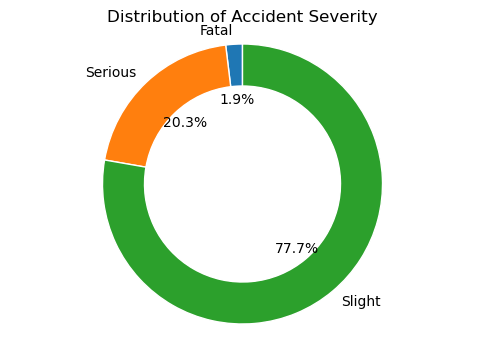

In [42]:
accident_severity = combined_df['accident_severity']

# Convert accident severity to corresponding labels
labels = ['Fatal' if x == 1 else 'Serious' if x == 2 else 'Slight' for x in accident_severity]

# Count occurrences of each label
severity_counts = [labels.count('Fatal'), labels.count('Serious'), labels.count('Slight')]

# Create a figure and axis
fig, ax = plt.subplots(figsize=(6, 4))

# Outer pie chart (doughnut)
outer_pie = ax.pie(severity_counts, labels=['Fatal', 'Serious', 'Slight'], autopct='%1.1f%%', startangle=90, radius=1)
plt.setp(outer_pie[0], width=0.3, edgecolor='white') 

# Inner pie chart (to create a hole in the doughnut)
ax.pie([1], radius=0.7, colors=['white'])

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

# Add a title
ax.set_title('Distribution of Accident Severity')

# Display the doughnut chart
plt.show()

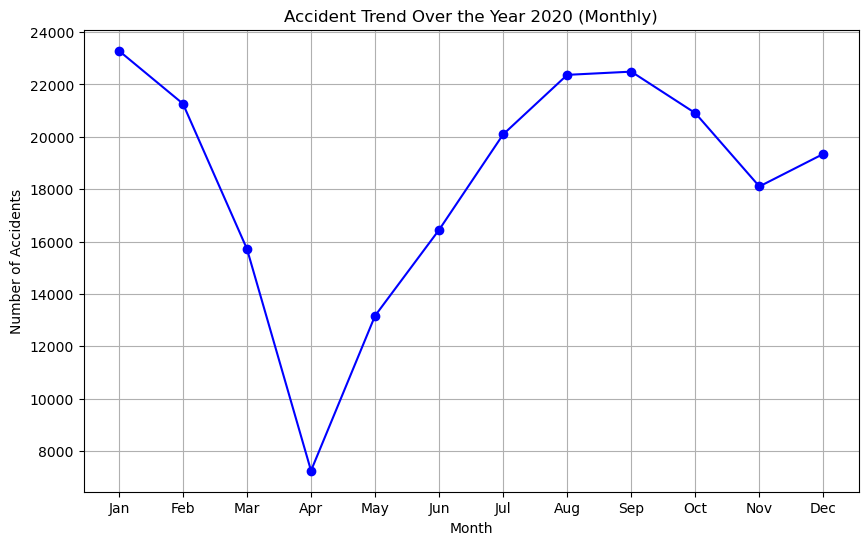

In [159]:
# Grouping the data by month and counting the number of accidents
accident_trend_monthly = combined_df.groupby(combined_df['date'].dt.to_period('M')).size()

# Creating a figure and axis object
fig1, ax1 = plt.subplots(figsize=(10, 6))

# Plotting the line series for accident trend over the year
ax1.plot(accident_trend_monthly.index.astype(str), accident_trend_monthly.values, color='blue', linestyle='-', marker='o')

# Adding title and labels
ax1.set_title('Accident Trend Over the Year 2020 (Monthly)')
ax1.set_xlabel('Month')
ax1.set_ylabel('Number of Accidents')

# Create a list of months for labeling
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set ticks and labels for each month
ax1.set_xticks(range(len(months)))
ax1.set_xticklabels(months)

# Displaying the plot
plt.grid(True)
plt.show()

In [44]:
sex_counts = combined_df['sex_of_driver'].value_counts()
print(sex_counts)

sex_of_driver
 1    140676
 2     57393
 3     22351
-1        15
Name: count, dtype: int64


In [45]:
# Replace -1 with 3 in the 'sex_of_driver' column
combined_df['sex_of_driver'] = combined_df['sex_of_driver'].replace(-1, 3)

# Verify the changes
sex_counts = combined_df['sex_of_driver'].value_counts()
print(sex_counts)

sex_of_driver
1    140676
2     57393
3     22366
Name: count, dtype: int64


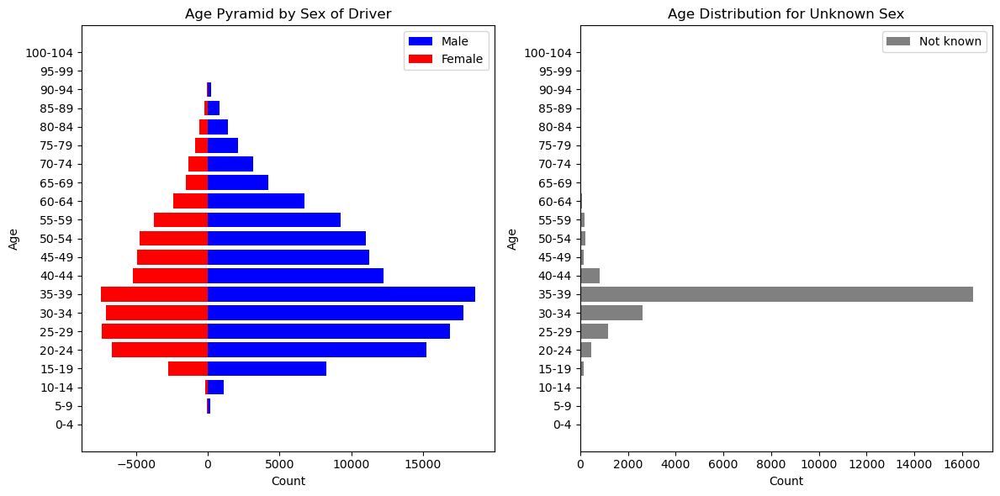

In [46]:
# Define the age bins
age_bins = list(range(0, 106, 5))

# Filter the DataFrame for each category
male_df = combined_df[combined_df['sex_of_driver'] == 1]
female_df = combined_df[combined_df['sex_of_driver'] == 2]
unknown_df = combined_df[combined_df['sex_of_driver'] == 3]

# Get the count of each age for each category
male_counts = pd.cut(male_df['age_of_driver'], bins=age_bins, right=False).value_counts().sort_index()
female_counts = pd.cut(female_df['age_of_driver'], bins=age_bins, right=False).value_counts().sort_index()
unknown_counts = pd.cut(unknown_df['age_of_driver'], bins=age_bins, right=False).value_counts().sort_index()

# Plot the pyramid
fig2, (ax2_0, ax2_1) = plt.subplots(1, 2, figsize=(12, 6))

ax2_0.barh(range(len(male_counts)), male_counts.values, color='blue', label='Male')
ax2_0.barh(range(len(female_counts)), -female_counts.values, color='red', label='Female')
ax2_0.set_yticks(range(len(male_counts)))
ax2_0.set_yticklabels([f'{bin.left}-{bin.right-1}' for bin in male_counts.index])
ax2_0.set_xlabel('Count')
ax2_0.set_ylabel('Age')
ax2_0.set_title('Age Pyramid by Sex of Driver')
ax2_0.legend()

ax2_1.barh(range(len(unknown_counts)), unknown_counts.values, color='gray', label='Not known')
ax2_1.set_yticks(range(len(unknown_counts)))
ax2_1.set_yticklabels([f'{bin.left}-{bin.right-1}' for bin in unknown_counts.index])
ax2_1.set_xlabel('Count')
ax2_1.set_ylabel('Age')
ax2_1.set_title('Age Distribution for Unknown Sex')
ax2_1.legend()

plt.tight_layout()
plt.show()


In [47]:
sex_of_casualty_counts = combined_df['sex_of_casualty'].value_counts()
print(sex_of_casualty_counts)

sex_of_casualty
 1    137918
 2     81115
-1      1393
 9         9
Name: count, dtype: int64


In [48]:
# Replace values not equal to 1 or 2 with 3
combined_df.loc[~combined_df['sex_of_casualty'].isin([1, 2]), 'sex_of_casualty'] = 3

# Verify the changes
sex_of_casualty_counts = combined_df['sex_of_casualty'].value_counts()
print(sex_of_casualty_counts)

sex_of_casualty
1    137918
2     81115
3      1402
Name: count, dtype: int64


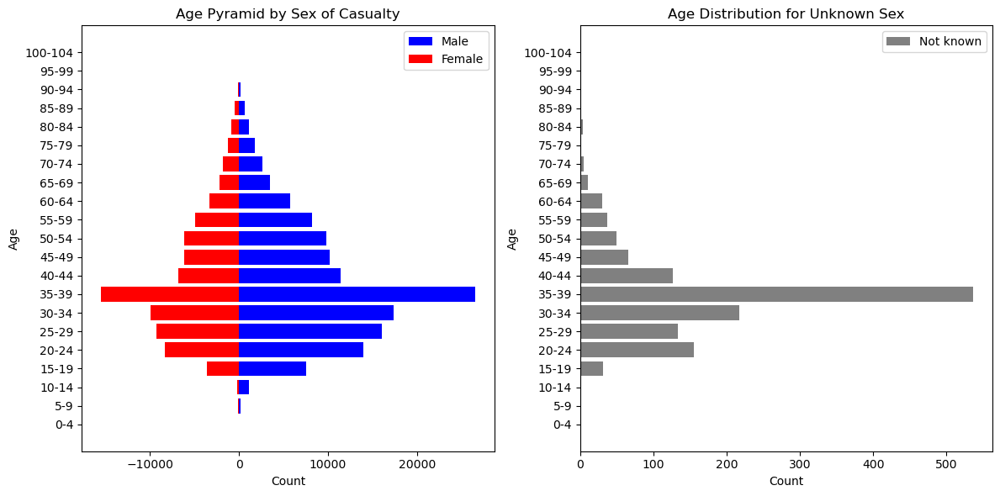

In [49]:
# Filter the DataFrame for each category
male_df = combined_df[combined_df['sex_of_casualty'] == 1]
female_df = combined_df[combined_df['sex_of_casualty'] == 2]
unknown_df = combined_df[~combined_df['sex_of_casualty'].isin([1, 2])]

# Get the count of each age for each category
male_counts = pd.cut(male_df['age_of_driver'], bins=age_bins, right=False).value_counts().sort_index()
female_counts = pd.cut(female_df['age_of_driver'], bins=age_bins, right=False).value_counts().sort_index()
unknown_counts = pd.cut(unknown_df['age_of_driver'], bins=age_bins, right=False).value_counts().sort_index()

# Plot the pyramid
fig3, (ax3_0, ax3_1) = plt.subplots(1, 2, figsize=(12, 6))

ax3_0.barh(range(len(male_counts)), male_counts.values, color='blue', label='Male')
ax3_0.barh(range(len(female_counts)), -female_counts.values, color='red', label='Female')
ax3_0.set_yticks(range(len(male_counts)))
ax3_0.set_yticklabels([f'{bin.left}-{bin.right-1}' for bin in male_counts.index])
ax3_0.set_xlabel('Count')
ax3_0.set_ylabel('Age')
ax3_0.set_title('Age Pyramid by Sex of Casualty')
ax3_0.legend()

ax3_1.barh(range(len(unknown_counts)), unknown_counts.values, color='gray', label='Not known')
ax3_1.set_yticks(range(len(unknown_counts)))
ax3_1.set_yticklabels([f'{bin.left}-{bin.right-1}' for bin in unknown_counts.index])
ax3_1.set_xlabel('Count')
ax3_1.set_ylabel('Age')
ax3_1.set_title('Age Distribution for Unknown Sex')
ax3_1.legend()
plt.tight_layout()
plt.show()

#### 1. Are there significant hours of the day, and days of the week, on which accidents occur?

In [50]:
# Define global variable for day names
day_names = {1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 5: 'Thursday', 6: 'Friday', 7: 'Saturday'}

In [51]:
def count_accidents(df, column):
    # Group by the specified column and count the unique occurrences of 'accident_index' within each group
    accidents_count = df.groupby(column)['accident_index'].nunique()
    return accidents_count

def find_significant_hours_and_days(df):
    # Calculate the total number of accidents by hour and day of the week
    accidents_by_day_hour = df.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
    total_accidents_by_hour = accidents_by_day_hour.sum(axis=0)
    total_accidents_by_day = accidents_by_day_hour.sum(axis=1)

    # Find the significant hours with the highest number of accidents
    significant_hours = total_accidents_by_hour.nlargest(5).index.tolist()

    # Find the significant days with the highest number of accidents
    significant_days = total_accidents_by_day.nlargest(5).index.tolist()

    return significant_hours, significant_days, accidents_by_day_hour, total_accidents_by_hour, total_accidents_by_day

# Find significant hours and days
significant_hours, significant_days, accidents_by_day_hour, total_accidents_by_hour, total_accidents_by_day = find_significant_hours_and_days(combined_df)
print("\nSignificant Hours:", significant_hours)
print("Significant Days:", [day_names[day] for day in significant_days])


Significant Hours: [17, 16, 15, 18, 14]
Significant Days: ['Friday', 'Thursday', 'Wednesday', 'Tuesday', 'Monday']


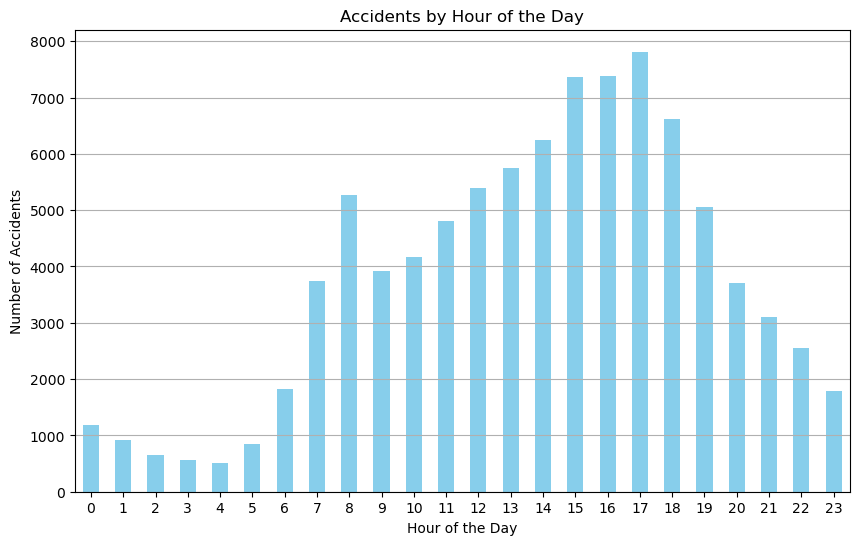

In [52]:
fig5, ax5 = plt.subplots(figsize=(10, 6))
accidents_per_hour = count_accidents(combined_df, 'hour')
accidents_per_hour.plot(kind='bar', color='skyblue', ax=ax5)
ax5.set_title('Accidents by Hour of the Day')
ax5.set_xlabel('Hour of the Day')
ax5.set_ylabel('Number of Accidents')
ax5.grid(axis='y')
plt.xticks(rotation=0)  # Rotate x-axis labels
plt.show()

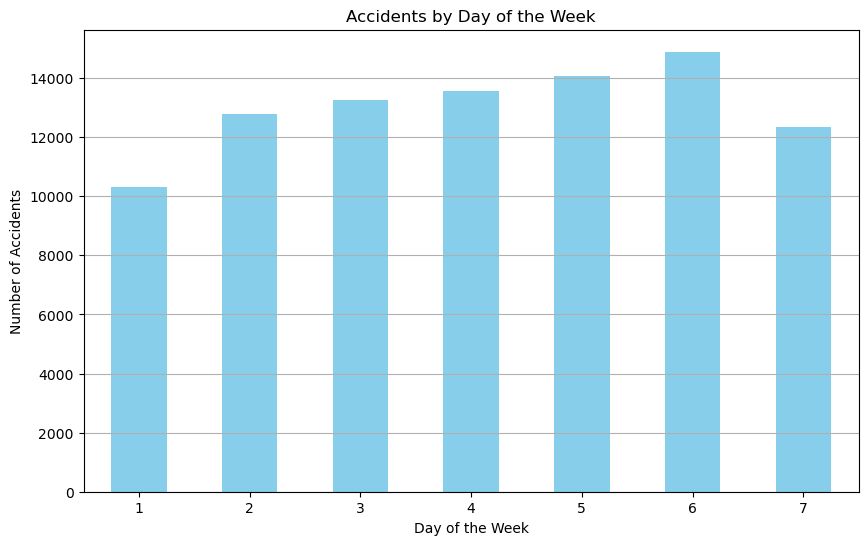

In [53]:
fig6, ax6 = plt.subplots(figsize=(10, 6))
accidents_per_day = count_accidents(combined_df, 'day_of_week')
accidents_per_day.plot(kind='bar', color='skyblue', ax=ax6)
ax6.set_title('Accidents by Day of the Week')
ax6.set_xlabel('Day of the Week')
ax6.set_ylabel('Number of Accidents')
ax6.grid(axis='y')
plt.xticks(rotation=0)  # Rotate x-axis labels
plt.show()

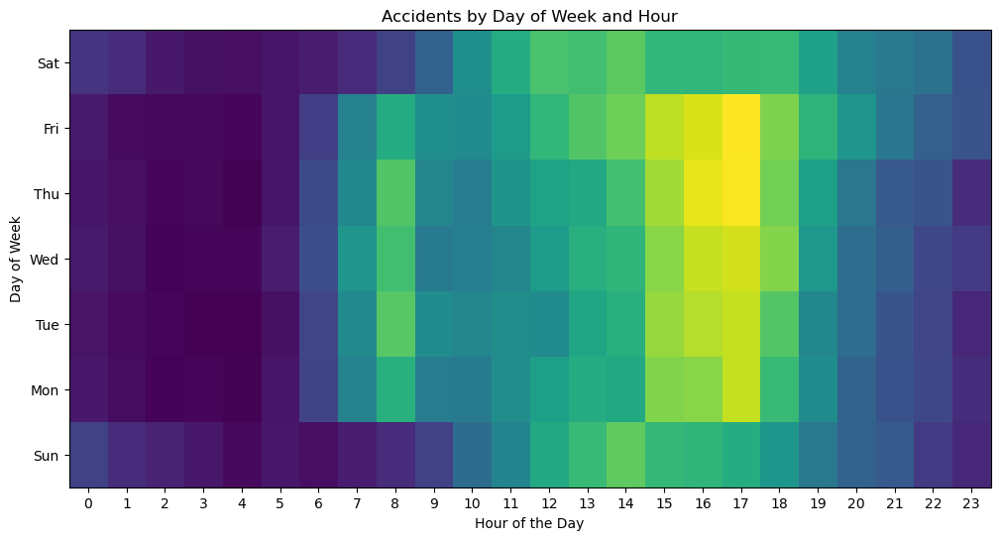

In [54]:
fig7, ax7 = plt.subplots(figsize=(12, 6))
img = ax7.imshow(accidents_by_day_hour, cmap='viridis', aspect='auto', origin='lower')
plt.colorbar(img, ax=ax6, label='Number of Accidents')  # Use img as the mappable
ax7.set_title('Accidents by Day of Week and Hour')
ax7.set_xlabel('Hour of the Day')
ax7.set_ylabel('Day of Week')
ax7.set_xticks(range(24))
ax7.set_yticks(range(7), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
plt.grid(False)

plt.show()

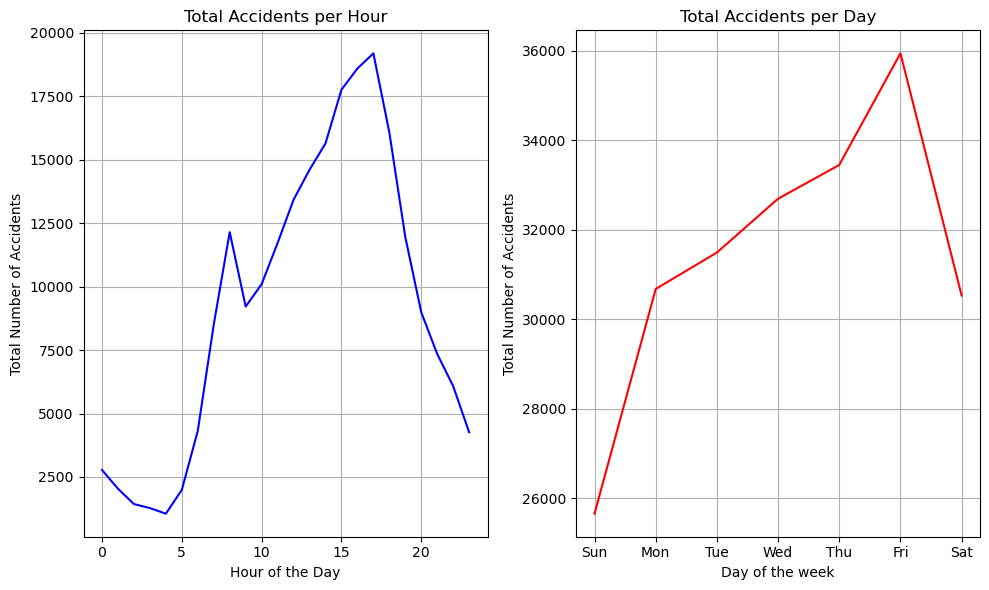

In [55]:
# Plotting time series
fig8, ax8 = plt.subplots(1, 2, figsize=(10, 6))

# Plotting the time series for total accidents per hour
ax8[0].plot(total_accidents_by_hour.index, total_accidents_by_hour.values, color='blue')
ax8[0].set_title('Total Accidents per Hour')
ax8[0].set_xlabel('Hour of the Day')
ax8[0].set_ylabel('Total Number of Accidents')
ax8[0].grid(True)

# Plotting the time series for total accidents per day
ax8[1].plot(total_accidents_by_day.index, total_accidents_by_day.values, color='red')
ax8[1].set_title('Total Accidents per Day')
ax8[1].set_xlabel('Day of the week')
ax8[1].set_ylabel('Total Number of Accidents')
ax8[1].set_xticks(range(1, 8))  # Set x-axis ticks
ax8[1].set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
ax8[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

#### 2. For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

Code

- 02. Motorcycle 50cc and under
- 03. Motorcycle over 50cc and up to 125cc
- 04. Motorcycle over 125cc and up to 500cc
- 05. Motorcycle over 500cc
- 97. Motorcycle – unknown cc
- 23. Electric motorcycle

In [56]:
vehicle_df = combined_df[['accident_index', 'vehicle_index', 'date', 'vehicle_type']]
vehicle_df

,accident_index,vehicle_index,date,vehicle_type
0,2020010219808,681716,2020-02-04,9
1,2020010220496,681717,2020-04-27,9
2,2020010220496,681717,2020-04-27,9
3,2020010228005,681718,2020-01-01,9
4,2020010228006,681719,2020-01-01,8
...,...,...,...,...
220430,2020991030297,849086,2020-04-15,9
220431,2020991030297,849087,2020-04-15,5
220432,2020991030900,849088,2020-12-15,9
220433,2020991030900,849089,2020-12-15,1


##### The significant hours of the day, and days of the week, on which accidents occur - Motorcycle 125cc and under i.e vehicle_type is 2 or 3

In [57]:
def significant_hours_and_days_vehicle_type_2_3(combined_df):
    # Filter the DataFrame for vehicle types '2' or '3'
    vehicle_type_2_3 = combined_df[combined_df['vehicle_type'].isin([2, 3])]
    
    # Calculate the total number of accidents by hour and day of the week for vehicle types '2' or '3'
    accidents_by_day_hour_2_3 = vehicle_type_2_3.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
    total_accidents_by_hour_2_3 = accidents_by_day_hour_2_3.sum(axis=0)
    total_accidents_by_day_2_3 = accidents_by_day_hour_2_3.sum(axis=1)

    # Find the significant hours with the highest number of accidents
    significant_hours = total_accidents_by_hour_2_3.nlargest(5).index.tolist()

    # Find the significant days with the highest number of accidents
    significant_days = total_accidents_by_day_2_3.nlargest(5).index.tolist()

    return significant_hours, significant_days, accidents_by_day_hour_2_3, total_accidents_by_hour_2_3, total_accidents_by_day_2_3

# Get significant hours and days for vehicle types '2' or '3'
significant_hours_2_3, significant_days_2_3, accidents_by_day_hour_2_3, total_accidents_by_hour_2_3, total_accidents_by_day_2_3 = significant_hours_and_days_vehicle_type_2_3(combined_df)
print("\nSignificant Hours for Motorcycle 125cc and under :", significant_hours_2_3)
print("Significant Days Motorcycle 125cc and under :", [day_names[day] for day in significant_days_2_3])


Significant Hours for Motorcycle 125cc and under : [17, 18, 16, 19, 15]
Significant Days Motorcycle 125cc and under : ['Friday', 'Thursday', 'Wednesday', 'Saturday', 'Tuesday']


In [58]:
total_accidents_by_day_2_3

day_of_week
1    1016
2    1258
3    1269
4    1323
5    1481
6    1568
7    1305
dtype: int64

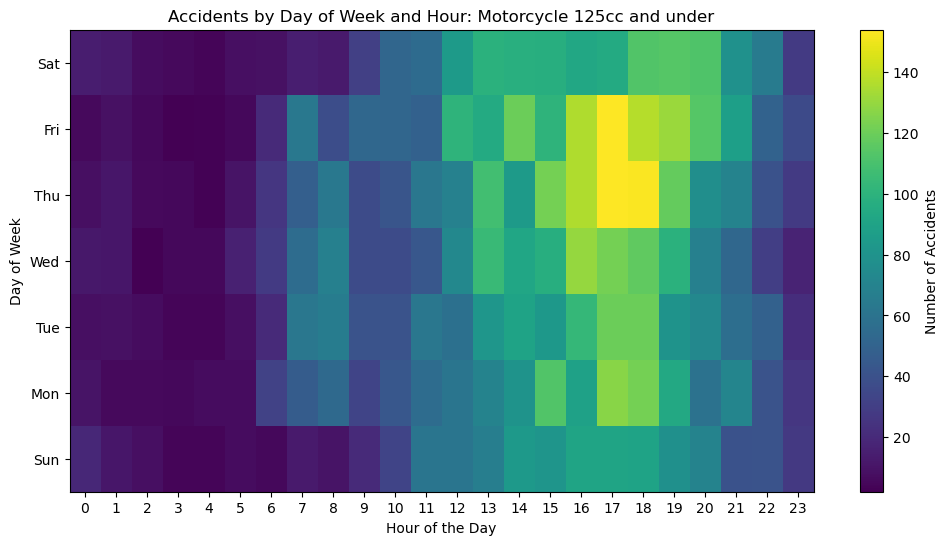

In [59]:
# Plotting
fig9, ax9 = plt.subplots(figsize=(12, 6))  
img = ax9.imshow(accidents_by_day_hour_2_3, cmap='viridis', aspect='auto', origin='lower')
plt.colorbar(img, ax=ax9, label='Number of Accidents')
ax9.set_title('Accidents by Day of Week and Hour: Motorcycle 125cc and under')
ax9.set_xlabel('Hour of the Day')
ax9.set_ylabel('Day of Week')
ax9.set_xticks(range(24))
ax9.set_yticks(range(7), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
plt.grid(False)
plt.show()

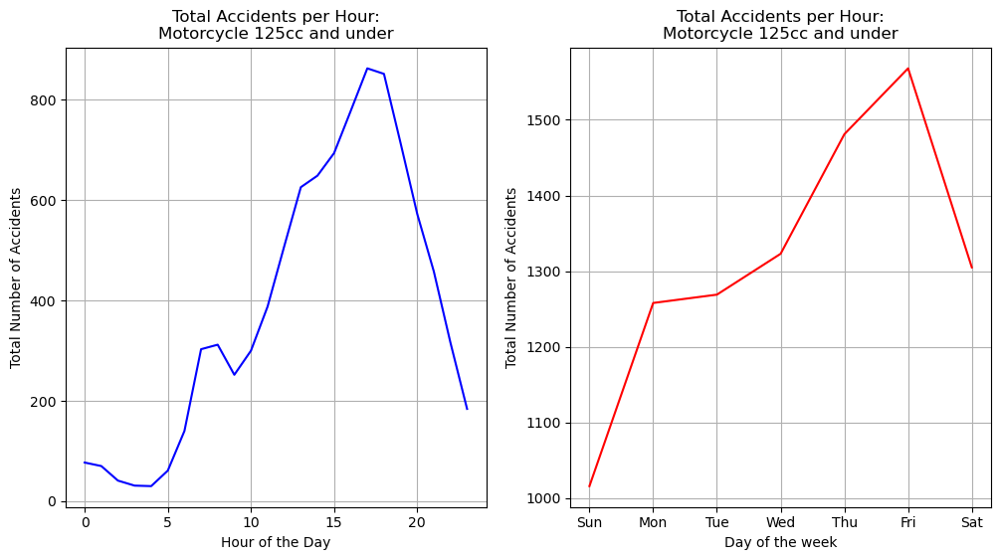

In [60]:
# Plotting time series
fig10, ax10 = plt.subplots(1, 2, figsize=(12, 6))

# Plotting the time series for total accidents per hour
ax10[0].plot(total_accidents_by_hour_2_3.index, total_accidents_by_hour_2_3.values, color='blue')
ax10[0].set_title('Total Accidents per Hour:\nMotorcycle 125cc and under')
ax10[0].set_xlabel('Hour of the Day')
ax10[0].set_ylabel('Total Number of Accidents')
ax10[0].grid(True)

# Plotting the time series for total accidents per day
ax10[1].plot(total_accidents_by_day_2_3.index, total_accidents_by_day_2_3.values, color='red')
ax10[1].set_title('Total Accidents per Hour:\nMotorcycle 125cc and under')
ax10[1].set_xlabel('Day of the week')
ax10[1].set_ylabel('Total Number of Accidents')
ax10[1].set_xticks(range(1, 8), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
ax10[1].grid(True)

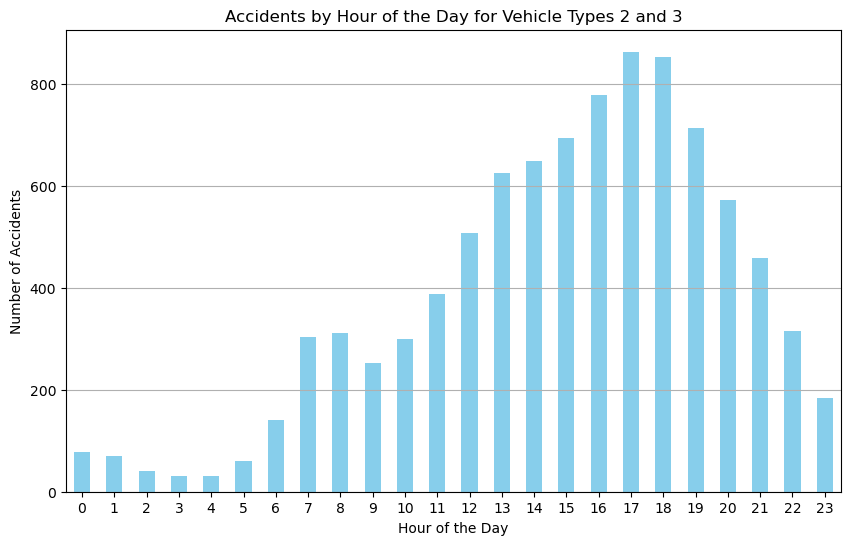

In [61]:
fig5, ax5 = plt.subplots(figsize=(10, 6))
total_accidents_by_hour_2_3.plot(kind='bar', color='skyblue', ax=ax5)
ax5.set_title('Accidents by Hour of the Day for Vehicle Types 2 and 3')
ax5.set_xlabel('Hour of the Day')
ax5.set_ylabel('Number of Accidents')
ax5.grid(axis='y')
plt.xticks(rotation=0)  # Rotate x-axis labels
plt.show()

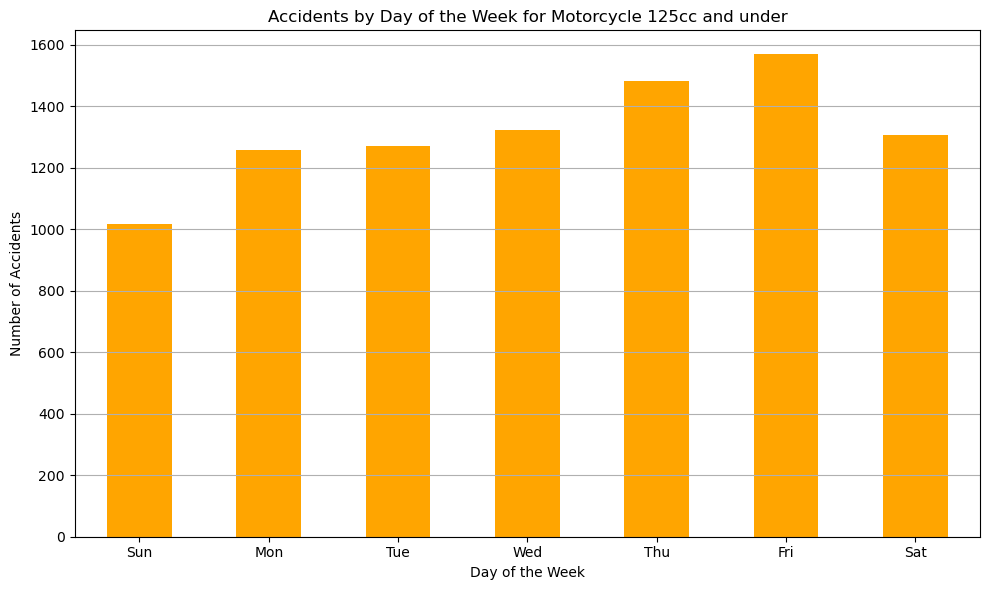

In [62]:
fig12, ax12 = plt.subplots(figsize=(10, 6))

# Plot accidents by day of the week
total_accidents_by_day_2_3.plot(kind='bar', color='orange', ax=ax12)
ax12.set_title('Accidents by Day of the Week for Motorcycle 125cc and under')
ax12.set_xlabel('Day of the Week')
ax12.set_ylabel('Number of Accidents')
ax12.grid(axis='y')
ax12.set_xticks(range(7))
ax12.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'], rotation=0)

plt.tight_layout()
plt.show()

##### The significant hours of the day, and days of the week, on which accidents occur - Motorcycle over 125cc and up to 500cc - vehicle_type = 4

In [63]:
def significant_hours_and_days_vehicle_type_4(combined_df):
    # Filter the DataFrame for vehicle types
    vehicle_type_4 = combined_df[combined_df['vehicle_type'] == 4]
    
    # Calculate the total number of accidents by hour and day of the week for vehicle types is 4
    accidents_by_day_hour_4 = vehicle_type_4.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
    total_accidents_by_hour_4 = accidents_by_day_hour_4.sum(axis=0)
    total_accidents_by_day_4 = accidents_by_day_hour_4.sum(axis=1)

    # Find the significant hours with the highest number of accidents
    significant_hours_4 = total_accidents_by_hour_4.nlargest(5).index.tolist()

    # Find the significant days with the highest number of accidents
    significant_days_4 = total_accidents_by_day_4.nlargest(5).index.tolist()

    return significant_hours_4, significant_days_4, accidents_by_day_hour_4, total_accidents_by_hour_4, total_accidents_by_day_4

# Get significant hours and days for vehicle types is 4
significant_hours_4, significant_days_4, accidents_by_day_hour_4, total_accidents_by_hour_4, total_accidents_by_day_4 = significant_hours_and_days_vehicle_type_4(combined_df)
print("\nSignificant Hours for Motorcycle over 125cc and up to 500cc:", significant_hours_4)
print("Significant Days for Motorcycle over 125cc and up to 500cc:", [day_names[day] for day in significant_days_4])


Significant Hours for Motorcycle over 125cc and up to 500cc: [17, 16, 15, 18, 14]
Significant Days for Motorcycle over 125cc and up to 500cc: ['Friday', 'Thursday', 'Wednesday', 'Saturday', 'Sunday']


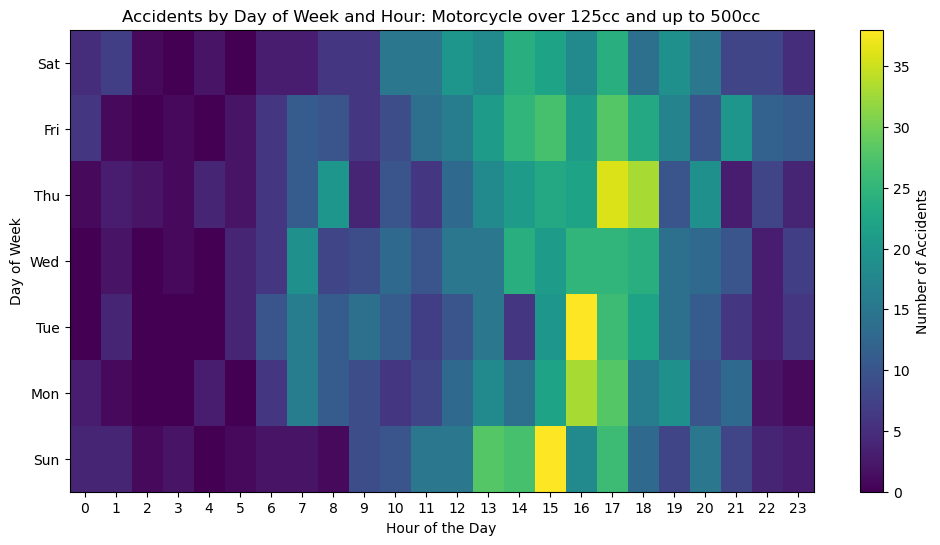

In [64]:
# Plotting
fig13, ax13 = plt.subplots(figsize=(12, 6))  
img = ax13.imshow(accidents_by_day_hour_4, cmap='viridis', aspect='auto', origin='lower')
plt.colorbar(img, ax=ax13, label='Number of Accidents')
ax13.set_title('Accidents by Day of Week and Hour: Motorcycle over 125cc and up to 500cc')
ax13.set_xlabel('Hour of the Day')
ax13.set_ylabel('Day of Week')
ax13.set_xticks(range(24))
ax13.set_yticks(range(7), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
plt.grid(False)
plt.show()

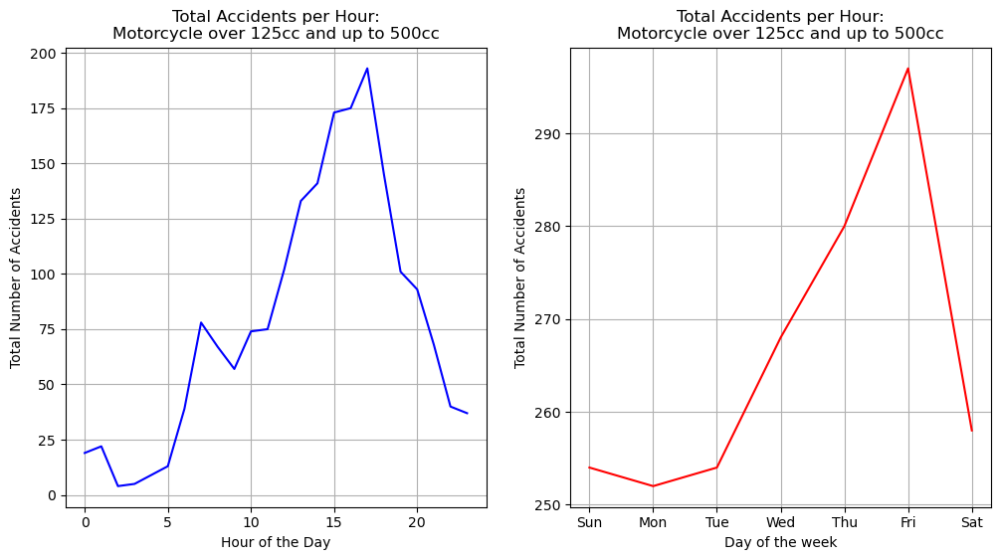

In [65]:
# Plotting time series
fig14, ax14 = plt.subplots(1, 2, figsize=(12, 6))

# Plotting the time series for total accidents per hour
ax14[0].plot(total_accidents_by_hour_4.index, total_accidents_by_hour_4.values, color='blue')
ax14[0].set_title('Total Accidents per Hour:\nMotorcycle over 125cc and up to 500cc')
ax14[0].set_xlabel('Hour of the Day')
ax14[0].set_ylabel('Total Number of Accidents')
ax14[0].grid(True)

# Plotting the time series for total accidents per day
ax14[1].plot(total_accidents_by_day_4.index, total_accidents_by_day_4.values, color='red')
ax14[1].set_title('Total Accidents per Hour:\nMotorcycle over 125cc and up to 500cc')
ax14[1].set_xlabel('Day of the week')
ax14[1].set_ylabel('Total Number of Accidents')
ax14[1].set_xticks(range(1, 8), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
ax14[1].grid(True)

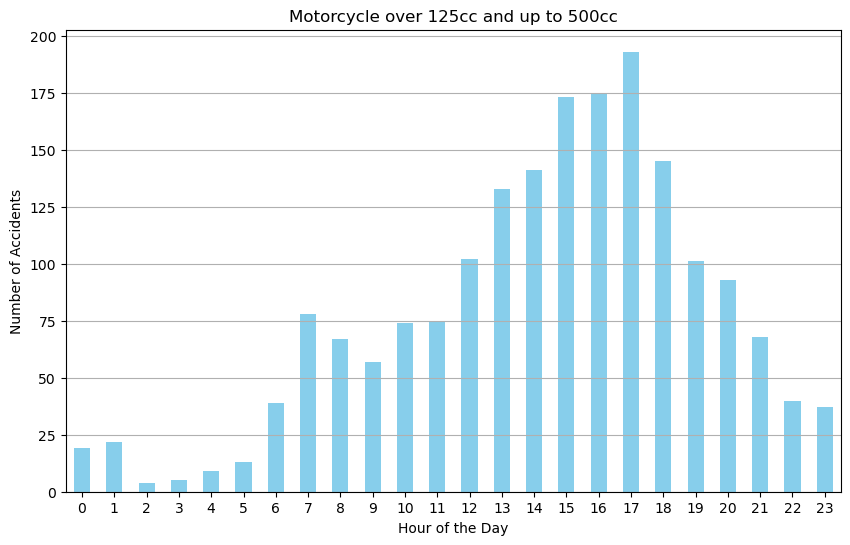

In [66]:
fig15, ax15 = plt.subplots(figsize=(10, 6))
total_accidents_by_hour_4.plot(kind='bar', color='skyblue', ax=ax15)
ax15.set_title('Motorcycle over 125cc and up to 500cc')
ax15.set_xlabel('Hour of the Day')
ax15.set_ylabel('Number of Accidents')
ax15.grid(axis='y')
plt.xticks(rotation=0)  # Rotate x-axis labels
plt.show()

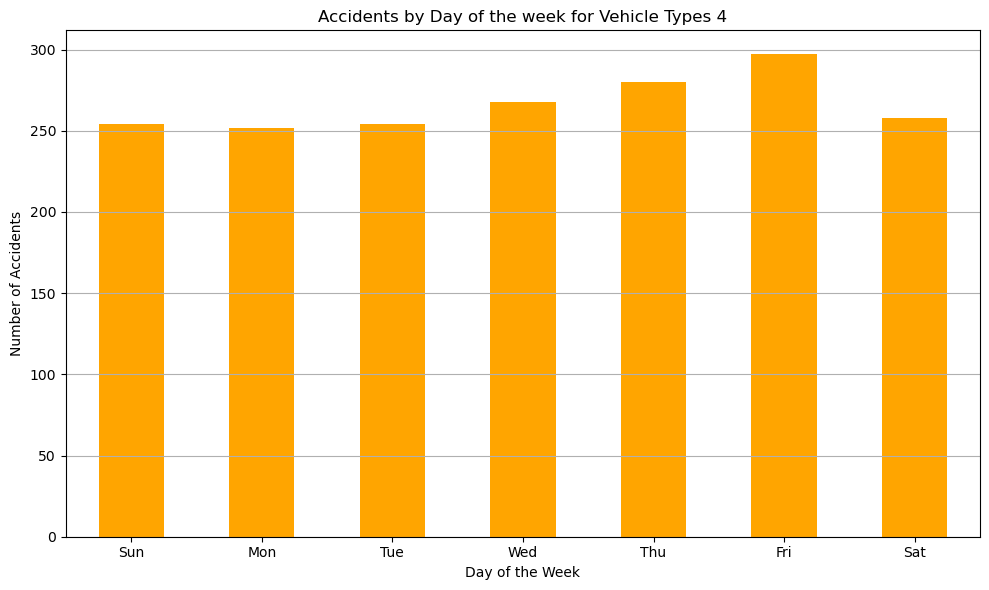

In [67]:
fig16, ax16 = plt.subplots(figsize=(10, 6))

# Plot accidents by day of the week
total_accidents_by_day_4.plot(kind='bar', color='orange', ax=ax16)
ax16.set_title('Accidents by Day of the week for Vehicle Types 4')
ax16.set_xlabel('Day of the Week')
ax16.set_ylabel('Number of Accidents')
ax16.grid(axis='y')
ax16.set_xticks(range(7))
ax16.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'], rotation=0)

plt.tight_layout()
plt.show()

##### The significant hours of the day, and days of the week, on which accidents occur - Motorcycle over 500cc i.e vehicle_type is 5

In [68]:
def significant_hours_and_days_vehicle_type_5(combined_df):
    # Filter the DataFrame for vehicle types
    vehicle_type_5 = combined_df[combined_df['vehicle_type'] == 5]
    
    # Calculate the total number of accidents by hour and day of the week for vehicle types is 5
    accidents_by_day_hour_5 = vehicle_type_5.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
    total_accidents_by_hour_5 = accidents_by_day_hour_5.sum(axis=0)
    total_accidents_by_day_5 = accidents_by_day_hour_5.sum(axis=1)

    # Find the significant hours with the highest number of accidents
    significant_hours_5 = total_accidents_by_hour_5.nlargest(5).index.tolist()

    # Find the significant days with the highest number of accidents
    significant_days_5 = total_accidents_by_day_5.nlargest(5).index.tolist()

    return significant_hours_5, significant_days_5, accidents_by_day_hour_5, total_accidents_by_hour_5, total_accidents_by_day_5

# Get significant hours and days for vehicle types is 5
significant_hours_5, significant_days_5, accidents_by_day_hour_5, total_accidents_by_hour_5, total_accidents_by_day_5 = significant_hours_and_days_vehicle_type_5(combined_df)
print("\nSignificant Hours for Motorcycle over 500cc :", significant_hours_5)
print("Significant Days for Motorcycle over 500cc :", [day_names[day] for day in significant_days_5])


Significant Hours for Motorcycle over 500cc : [17, 16, 13, 14, 15]
Significant Days for Motorcycle over 500cc : ['Sunday', 'Saturday', 'Friday', 'Thursday', 'Wednesday']


In [69]:
total_accidents_by_day_5

day_of_week
1    830
2    542
3    569
4    576
5    578
6    645
7    653
dtype: int64

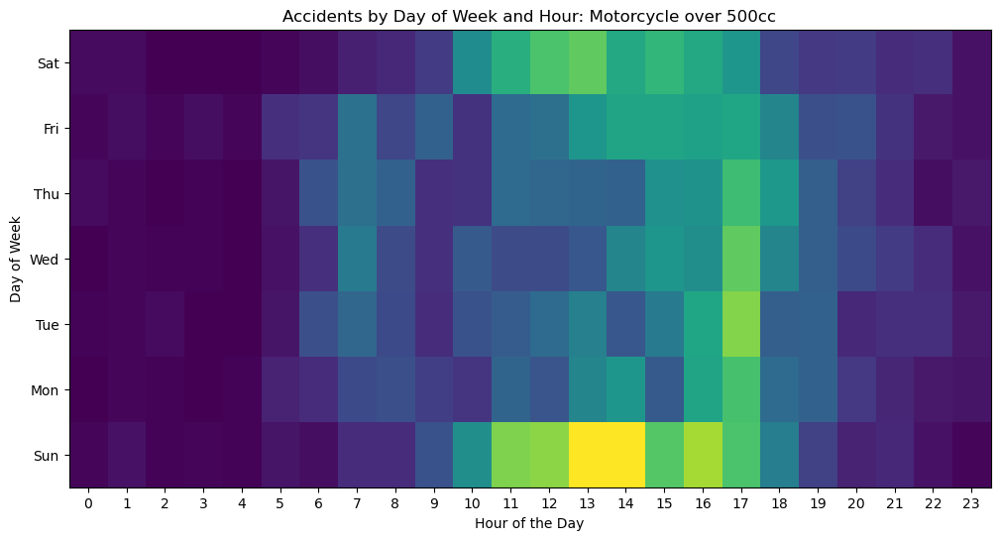

In [70]:
# Plotting
fig17, ax17 = plt.subplots(figsize=(12, 6))  
img = ax17.imshow(accidents_by_day_hour_5, cmap='viridis', aspect='auto', origin='lower')
plt.colorbar(img, ax=ax13, label='Number of Accidents')
ax17.set_title('Accidents by Day of Week and Hour: Motorcycle over 500cc')
ax17.set_xlabel('Hour of the Day')
ax17.set_ylabel('Day of Week')
ax17.set_xticks(range(24))
ax17.set_yticks(range(7), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
plt.grid(False)
plt.show()

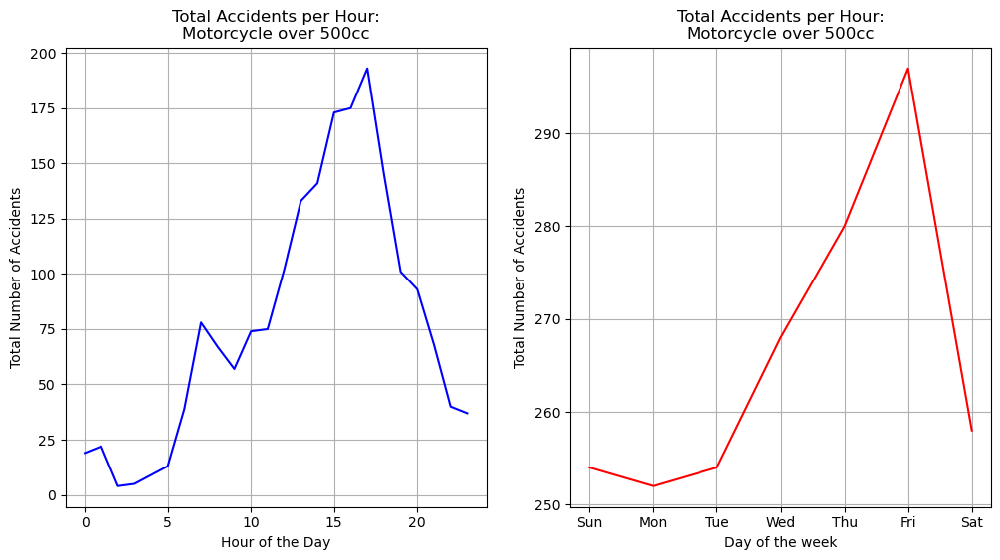

In [71]:
# Plotting time series
fig18, ax18 = plt.subplots(1, 2, figsize=(12, 6))

# Plotting the time series for total accidents per hour
ax18[0].plot(total_accidents_by_hour_5.index, total_accidents_by_hour_4.values, color='blue')
ax18[0].set_title('Total Accidents per Hour:\nMotorcycle over 500cc')
ax18[0].set_xlabel('Hour of the Day')
ax18[0].set_ylabel('Total Number of Accidents')
ax18[0].grid(True)

# Plotting the time series for total accidents per day
ax18[1].plot(total_accidents_by_day_5.index, total_accidents_by_day_4.values, color='red')
ax18[1].set_title('Total Accidents per Hour:\nMotorcycle over 500cc')
ax18[1].set_xlabel('Day of the week')
ax18[1].set_ylabel('Total Number of Accidents')
ax18[1].set_xticks(range(1, 8), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
ax18[1].grid(True)

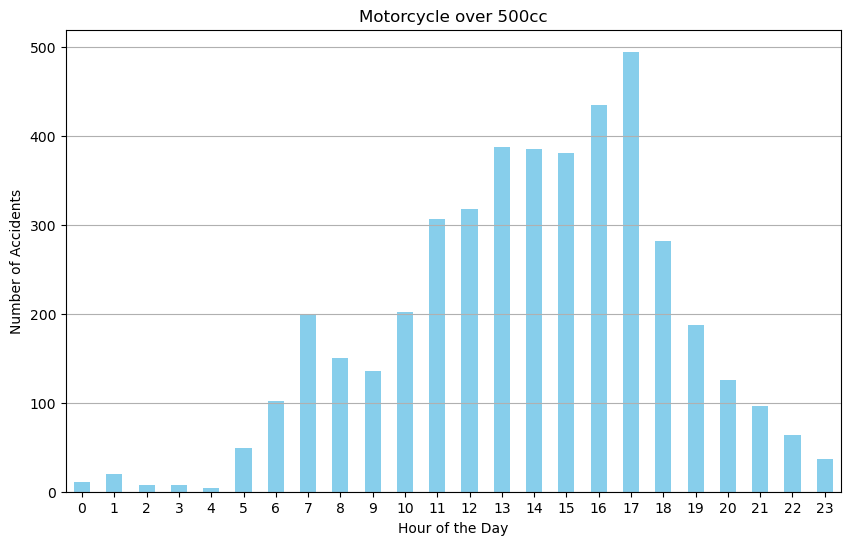

In [72]:
fig19, ax19 = plt.subplots(figsize=(10, 6))
total_accidents_by_hour_5.plot(kind='bar', color='skyblue', ax=ax19)
ax19.set_title('Motorcycle over 500cc')
ax19.set_xlabel('Hour of the Day')
ax19.set_ylabel('Number of Accidents')
ax19.grid(axis='y')
plt.xticks(rotation=0)  # Rotate x-axis labels
plt.show()

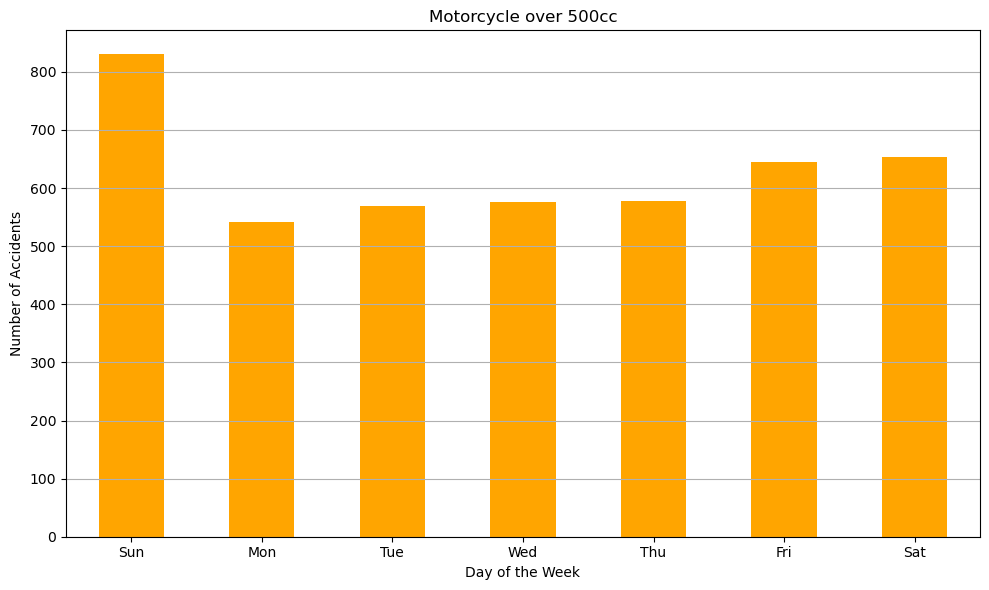

In [73]:
fig20, ax20 = plt.subplots(figsize=(10, 6))

# Plot accidents by day of the week
total_accidents_by_day_5.plot(kind='bar', color='orange', ax=ax20)
ax20.set_title('Motorcycle over 500cc')
ax20.set_xlabel('Day of the Week')
ax20.set_ylabel('Number of Accidents')
ax20.grid(axis='y')
ax20.set_xticks(range(7))
ax20.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'], rotation=0)

plt.tight_layout()
plt.show()

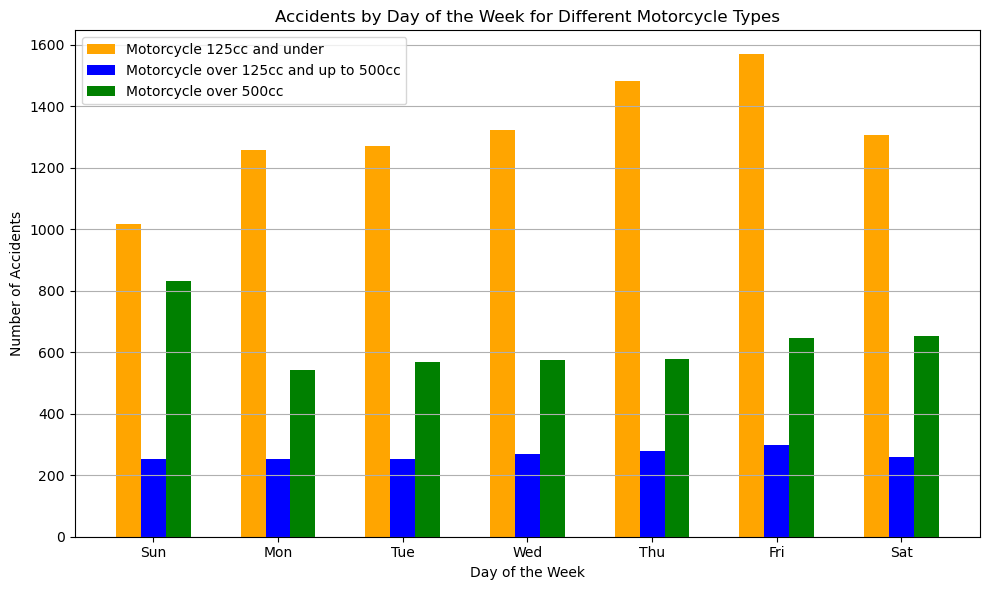

In [74]:
# Define the width of each bar
bar_width = 0.2

# Define the x positions for the bars
x = np.arange(len(total_accidents_by_day_2_3))

fig21, ax21 = plt.subplots(figsize=(10, 6))

# Plot accidents by day of the week for Motorcycle 125cc and under
ax21.bar(x - bar_width, total_accidents_by_day_2_3, width=bar_width, color='orange', label='Motorcycle 125cc and under')

# Plot accidents by day of the week for Vehicle Types 4
ax21.bar(x, total_accidents_by_day_4, width=bar_width, color='blue', label='Motorcycle over 125cc and up to 500cc')

# Plot accidents by day of the week for Vehicle Types 5
ax21.bar(x + bar_width, total_accidents_by_day_5, width=bar_width, color='green', label='Motorcycle over 500cc')

ax21.set_title('Accidents by Day of the Week for Different Motorcycle Types')
ax21.set_xlabel('Day of the Week')
ax21.set_ylabel('Number of Accidents')
ax21.grid(axis='y')
ax21.set_xticks(x)
ax21.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])

# Add legend
ax21.legend()

plt.tight_layout()
plt.show()

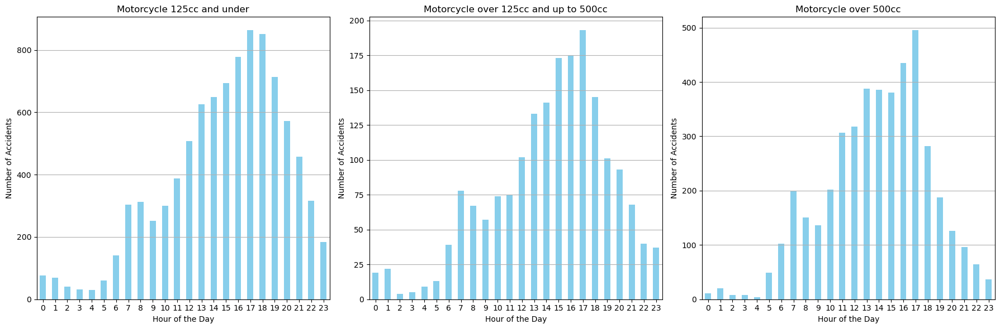

In [162]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot the first dataset on the first subplot
total_accidents_by_hour_2_3.plot(kind='bar', color='skyblue', ax=axes[0])
axes[0].set_title('Motorcycle 125cc and under')
axes[0].set_xlabel('Hour of the Day')
axes[0].set_ylabel('Number of Accidents')
axes[0].grid(axis='y')
axes[0].tick_params(axis='x', rotation=0)

# Plot the second dataset on the second subplot
total_accidents_by_hour_4.plot(kind='bar', color='skyblue', ax=axes[1])
axes[1].set_title('Motorcycle over 125cc and up to 500cc')
axes[1].set_xlabel('Hour of the Day')
axes[1].set_ylabel('Number of Accidents')
axes[1].grid(axis='y')
axes[1].tick_params(axis='x', rotation=0)

# Plot the third dataset on the third subplot
total_accidents_by_hour_5.plot(kind='bar', color='skyblue', ax=axes[2])
axes[2].set_title('Motorcycle over 500cc')
axes[2].set_xlabel('Hour of the Day')
axes[2].set_ylabel('Number of Accidents')
axes[2].grid(axis='y')
axes[2].tick_params(axis='x', rotation=0)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


#### 3. For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

In [75]:
combined_df['casualty_class'].unique()

array([3, 1, 2], dtype=int64)

In [76]:
def significant_hours_and_days_pedestrian(combined_df):
    # Filter the DataFrame for casualty class
    pedestrian = combined_df[combined_df['casualty_class'] == 3]
    
    # Calculate the total number of accidents by hour and day of the week for pedestrian
    accidents_by_day_hour_ped = pedestrian.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
    total_accidents_by_hour_ped = accidents_by_day_hour_ped.sum(axis=0)
    total_accidents_by_day_ped = accidents_by_day_hour_ped.sum(axis=1)

    # Find the significant hours with the highest number of accidents
    significant_hours_ped = total_accidents_by_hour_ped.nlargest(5).index.tolist()

    # Find the significant days with the highest number of accidents
    significant_days_ped = total_accidents_by_day_ped.nlargest(5).index.tolist()

    return significant_hours_ped, significant_days_ped, accidents_by_day_hour_ped, total_accidents_by_hour_ped, total_accidents_by_day_ped

# Get significant hours and days for casualty class is pedestrian
significant_hours_ped, significant_days_ped, accidents_by_day_hour_ped, total_accidents_by_hour_ped, total_accidents_by_day_ped = significant_hours_and_days_pedestrian(combined_df)
print("\nSignificant Hours for pedestrian:", significant_hours_ped)
print("Significant Days for pedestrian:", [day_names[day] for day in significant_days_ped])


Significant Hours for pedestrian: [15, 16, 17, 18, 8]
Significant Days for pedestrian: ['Friday', 'Thursday', 'Tuesday', 'Wednesday', 'Monday']


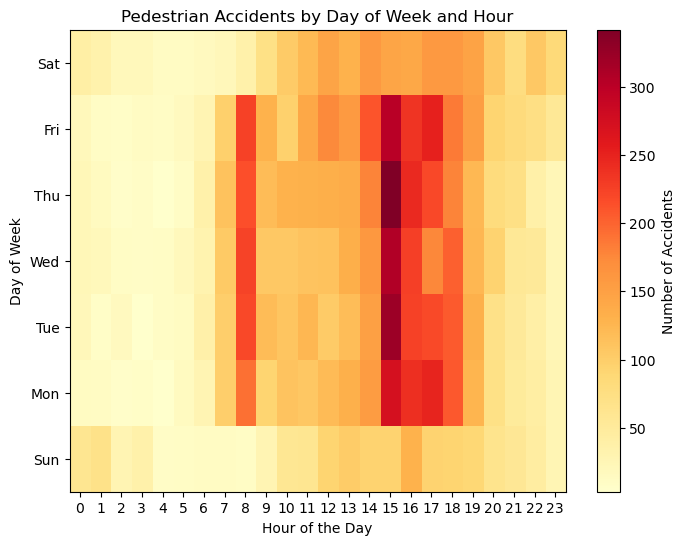

In [77]:
# Heatmap: the frequency of pedestrian accidents across different hours of the day and days of the week

fig22, ax22 = plt.subplots(figsize=(8, 6))
heatmap = ax22.imshow(accidents_by_day_hour_ped, cmap='YlOrRd', aspect='auto', origin='lower')
plt.colorbar(heatmap, ax=ax22, label='Number of Accidents')
ax22.set_title('Pedestrian Accidents by Day of Week and Hour')
ax22.set_xlabel('Hour of the Day')
ax22.set_ylabel('Day of Week')
ax22.set_xticks(range(24))
ax22.set_yticks(range(7), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
plt.grid(False)
plt.show()

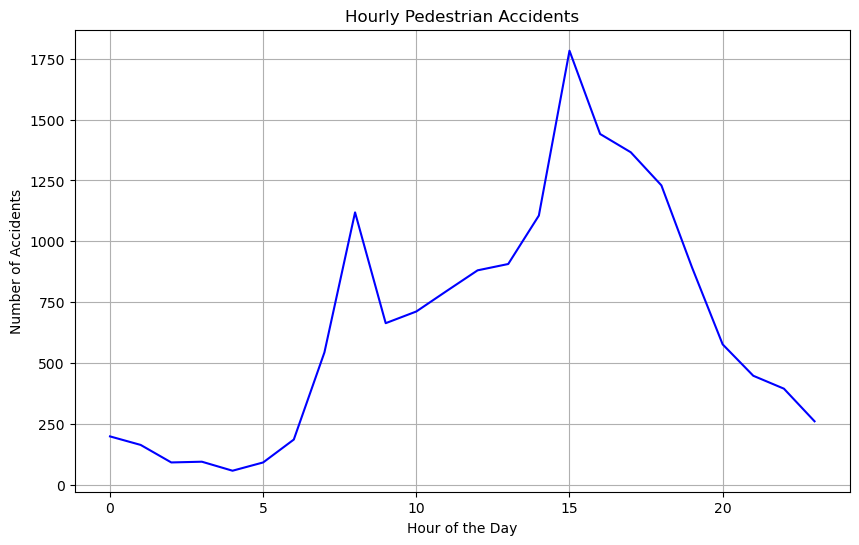

In [78]:
# Line chart: The trend of pedestrian accidents over time
fig23, ax23 = plt.subplots(figsize=(10, 6))
ax23.plot(total_accidents_by_hour_ped.index, total_accidents_by_hour_ped.values, color='blue')
ax23.set_title('Hourly Pedestrian Accidents')
ax23.set_xlabel('Hour of the Day')
ax23.set_ylabel('Number of Accidents')
ax23.grid(True)
plt.show()

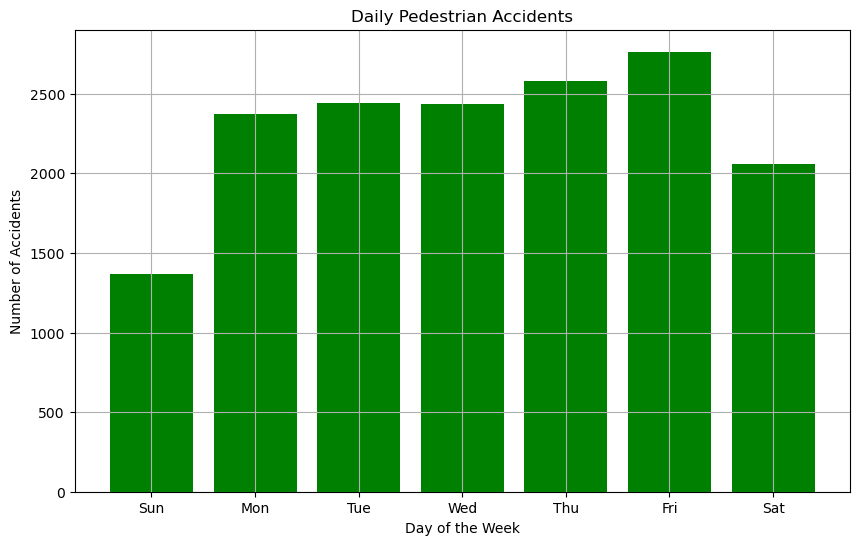

In [79]:
# Bar chart: The total number of pedestrian accidents for each hour of the day or each day of the week
fig24, ax24 = plt.subplots(figsize=(10, 6))
ax24.bar(total_accidents_by_day_ped.index, total_accidents_by_day_ped.values, color='green')
ax24.set_title('Daily Pedestrian Accidents')
ax24.set_xlabel('Day of the Week')
ax24.set_ylabel('Number of Accidents')
ax24.set_xticks(range(1, 8), ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
ax24.grid(True)
plt.show()

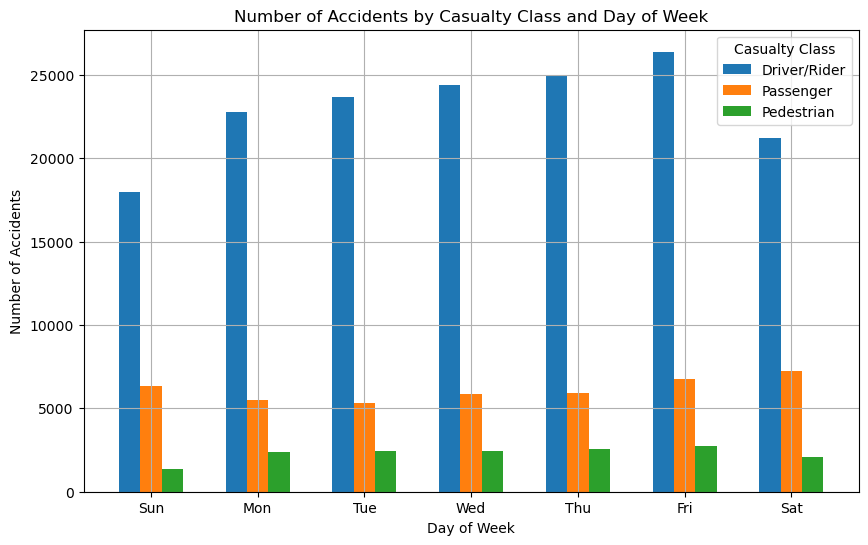

In [80]:
# Group the data by 'day_of_week' and 'casualty_class' and count the number of accidents
accidents_by_casualty_class = combined_df.groupby(['day_of_week', 'casualty_class']).size().unstack(fill_value=0)

# Define labels for each casualty class
casualty_labels = {1: 'Driver/Rider', 2: 'Passenger', 3: 'Pedestrian'}

# Plotting
fig25, ax25 = plt.subplots(figsize=(10, 6))

# Define the width of each bar cluster
bar_width = 0.2

# Define the x positions for each group of bars
x = np.arange(len(accidents_by_casualty_class.index))

# Plot each casualty class as a separate clustered bar
for i, casualty_class in enumerate(accidents_by_casualty_class.columns):
    ax25.bar(x + i * bar_width, accidents_by_casualty_class[casualty_class], width=bar_width, label=casualty_labels.get(casualty_class, str(casualty_class)))

ax25.set_title('Number of Accidents by Casualty Class and Day of Week')
ax25.set_xlabel('Day of Week')
ax25.set_ylabel('Number of Accidents')
ax25.set_xticks(x + bar_width * (len(accidents_by_casualty_class.columns) - 1) / 2)
ax25.set_xticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
ax25.legend(title='Casualty Class')
plt.grid(True)
plt.show()

#### 4. Using the apriori algorithm, explore the impact of selected variables on accident severity. 

##### The following features could be used

Weather Conditions: Such as rain, snow, fog, or clear weather.

Road Surface Conditions: Such as wet, dry, icy, or snowy roads.

Lighting Conditions: Such as daylight, darkness with streetlights, darkness without streetlights, or dawn/dusk.

Vehicle Type: The type of vehicles involved in the accident.

Speed Limit: The speed limit of the road where the accident occurred.

Number of Vehicles Involved: The count of vehicles involved in the accident.

Time of Day: The hour of the day when the accident occurred.

Day of Week: The day of the week when the accident occurred.

Road Type: Such as motorway, A-road, B-road, or local road.

In [81]:
# Define Columns to Extract
selected_variables = [ 'speed_limit', 'junction_detail', 'number_of_casualties', 'age_of_casualty',
                      'light_conditions', 'urban_or_rural_area', 'weather_conditions','road_surface_conditions', 
                      'age_of_driver', 'age_of_vehicle', 'number_of_vehicles',  'sex_of_driver',
                      'vehicle_type', 'road_type']

In [82]:
def generate_association_rules(combined_df, selected_variables, min_support=0.2, min_confidence=0.7):
    # Filter data for each severity class (fatal, serious, slight)
    df_fatal = combined_df[combined_df['accident_severity'] == 1]
    df_serious = combined_df[combined_df['accident_severity'] == 2]
    df_slight = combined_df[combined_df['accident_severity'] == 3]

    # Preprocess data using one-hot encoding
    encoded_df_fatal = pd.get_dummies(df_fatal[selected_variables], columns=selected_variables).astype('int')
    encoded_df_serious = pd.get_dummies(df_serious[selected_variables], columns=selected_variables).astype('int')
    encoded_df_slight = pd.get_dummies(df_slight[selected_variables], columns=selected_variables).astype('int')

    # Convert dataframes to boolean type
    encoded_df_fatal = encoded_df_fatal.astype(bool)
    encoded_df_serious = encoded_df_serious.astype(bool)
    encoded_df_slight = encoded_df_slight.astype(bool)

    # Apply Apriori for each severity class
    freq_item_sets_fatal = apriori(encoded_df_fatal, min_support=min_support, use_colnames=True)
    freq_item_sets_serious = apriori(encoded_df_serious, min_support=min_support, use_colnames=True)
    freq_item_sets_slight = apriori(encoded_df_slight, min_support=min_support, use_colnames=True)

    # Generate association rules for each severity class
    rules_fatal = association_rules(freq_item_sets_fatal, metric="confidence", min_threshold=min_confidence)
    rules_serious = association_rules(freq_item_sets_serious, metric="confidence", min_threshold=min_confidence)
    rules_slight = association_rules(freq_item_sets_slight, metric="confidence", min_threshold=min_confidence)

    return rules_fatal, rules_serious, rules_slight

In [83]:
# Define minimum support and confidence
min_support = 0.25
min_confidence = 0.71

# Call the function
rules_fatal, rules_serious, rules_slight = generate_association_rules(combined_df, selected_variables, min_support, min_confidence)

# Selecting the desired columns for display
columns_to_display = ['antecedents', 'consequents', 'support', 'confidence', 'lift']

In [84]:
# Define a scoring function
def score_rule(rule):
    # Define a scoring metric
    score = rule['support'] * rule['confidence'] * rule['lift']
    return score

# Score each rule for the "fatal" severity class
rules_fatal['score'] = rules_fatal.apply(score_rule, axis=1)

# Rank rules by score for the "fatal" severity class
rules_fatal_sorted = rules_fatal.sort_values(by='score', ascending=False)

# Select the top rule for the "fatal" severity class
best_rule_fatal = rules_fatal_sorted.head(5)

# Display the selected columns for the best rule for the "fatal" severity class
print("Best Rule for Fatal Severity:")
best_rule_fatal[columns_to_display]

Best Rule for Fatal Severity:


,antecedents,consequents,support,confidence,lift
24,(road_surface_conditions_1),(weather_conditions_1),0.607421,0.965802,1.215802
130,"(road_surface_conditions_1, road_type_6)",(weather_conditions_1),0.478847,0.970307,1.221472
25,(weather_conditions_1),(road_surface_conditions_1),0.607421,0.764653,1.215802
124,"(road_surface_conditions_1, sex_of_driver_1)",(weather_conditions_1),0.480028,0.965763,1.215752
56,(speed_limit_60),"(road_type_6, urban_or_rural_area_2)",0.339636,0.912961,1.738405


In [85]:
# Score each rule for the "serious" severity class
rules_serious['score'] = rules_serious.apply(score_rule, axis=1)

# Rank rules by score for the "serious" severity class
rules_serious_sorted = rules_serious.sort_values(by='score', ascending=False)

# Select the top rule for the "serious" severity class
best_rule_serious = rules_serious_sorted.head(5)

# Display the selected columns for the best rule for the "serious" severity class
print("Best Rule for Serious Severity:")
best_rule_serious[columns_to_display]

Best Rule for Serious Severity:


,antecedents,consequents,support,confidence,lift
25,(road_surface_conditions_1),(weather_conditions_1),0.655126,0.950451,1.193235
26,(weather_conditions_1),(road_surface_conditions_1),0.655126,0.822472,1.193235
111,"(road_surface_conditions_1, light_conditions_1)",(weather_conditions_1),0.506291,0.956588,1.200939
165,"(road_surface_conditions_1, road_type_6)",(weather_conditions_1),0.505889,0.949387,1.191898
113,"(light_conditions_1, weather_conditions_1)",(road_surface_conditions_1),0.506291,0.868946,1.260659


In [86]:
# Score each rule for the "slight" severity class
rules_slight['score'] = rules_slight.apply(score_rule, axis=1)

# Rank rules by score for the "slight" severity class
rules_slight_sorted = rules_slight.sort_values(by='score', ascending=False)

# Select the top rule for the "slight" severity class
best_rule_slight = rules_slight_sorted.head(5)

# Display the selected columns for the best rule for the "slight" severity class
print("Best Rule for Slight Severity:")
best_rule_slight[columns_to_display]

Best Rule for Slight Severity:


,antecedents,consequents,support,confidence,lift
30,(road_surface_conditions_1),(weather_conditions_1),0.650284,0.940971,1.204637
31,(weather_conditions_1),(road_surface_conditions_1),0.650284,0.832497,1.204637
142,"(road_surface_conditions_1, light_conditions_1)",(weather_conditions_1),0.513975,0.946620,1.211868
144,"(light_conditions_1, weather_conditions_1)",(road_surface_conditions_1),0.513975,0.870059,1.258990
203,"(road_surface_conditions_1, road_type_6)",(weather_conditions_1),0.465981,0.945390,1.210293


#### 5
Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region? 

E06000010 Kingston upon Hull, City of

E06000011 East Riding of Yorkshire

E06000013 North Lincolnshire

E06000012 North East Lincolnshire

In [87]:
# Define the list of values to filter
lsoa_values = ['E06000010', 'E06000011', 'E06000013', 'E06000012' #Kingston upon Hull, City of, East Riding of Yorkshire, North Lincolnshire , North East Lincolnshire
              'E07000163', 'E07000164', 'E07000165', 'E07000166', 'E07000167', 'E07000168', 'E07000169', #Craven, Hambleton Harrogate, Richmondshire, Ryedale, Scarborough, Selby
              'E06000014' #York
              'E08000032', 'E08000033', 'E08000034', 'E08000035', 'E08000036', #Bradford, Calderdale, Kirklees, Leeds, Wakefield
              ]

In [88]:
# Filter rows based on the specified values
filtered_region_df = combined_df[combined_df['local_authority_ons_district'].isin(lsoa_values)]

# Extract selected variables and location-related columns
selected_columns = selected_variables + ['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'local_authority_ons_district']
region_df = filtered_region_df[selected_columns]

# Display the filtered DataFrame with selected columns
region_df

,speed_limit,junction_detail,number_of_casualties,age_of_casualty,light_conditions,urban_or_rural_area,weather_conditions,road_surface_conditions,age_of_driver,age_of_vehicle,number_of_vehicles,sex_of_driver,vehicle_type,road_type,location_easting_osgr,location_northing_osgr,longitude,latitude,local_authority_ons_district
72790,30,0,2,62,4,1,1,1,39,3,1,1,9,6,502775.0,487949.0,-0.423111,54.276881,E07000168
72791,30,0,2,31,4,1,1,1,39,3,1,1,9,6,502775.0,487949.0,-0.423111,54.276881,E07000168
72792,60,0,1,34,1,2,1,1,49,4,2,1,1,6,478864.0,468738.0,-0.795254,54.108505,E07000167
72793,60,0,1,32,1,2,1,1,33,5,2,3,19,6,478864.0,468738.0,-0.795254,54.108505,E07000167
72794,60,0,1,58,6,2,1,2,58,6,2,2,9,6,467504.0,481050.0,-0.966222,54.220752,E07000167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91740,30,0,2,30,1,2,1,1,18,4,2,1,9,3,485978.0,408912.0,-0.703181,53.569801,E06000013
91741,70,0,2,18,1,2,1,1,42,3,2,3,21,3,485978.0,408912.0,-0.703181,53.569801,E06000013
91742,70,0,2,24,1,2,1,1,42,3,2,3,21,3,485978.0,408912.0,-0.703181,53.569801,E06000013
91743,30,3,1,31,4,1,1,1,35,2,2,3,9,6,509443.0,428632.0,-0.342063,53.742609,E06000010


In [89]:
from sklearn.cluster import KMeans
import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")

In [90]:
# Extract numerical features for clustering
accident_features = ['longitude', 'latitude']
X = region_df[accident_features]

# Apply k-means clustering with 25 clusters
kmeans = KMeans(n_clusters=25, random_state=42, n_init=10)
kmeans.fit(X)
clusters = kmeans.predict(X)

# Add the cluster labels to the DataFrame
region_df['cluster'] = clusters

#analyze the clusters and their characteristics
cluster_centers = kmeans.cluster_centers_

# Print the cluster centers
print("Cluster centers:")
print(cluster_centers)

Cluster centers:
[[-0.09340975 53.73553446]
 [-1.39396593 53.86276607]
 [-0.7701939  54.16871653]
 [-0.40996774 53.74124904]
 [-1.91243597 53.70802518]
 [-1.33901516 54.34359215]
 [-0.41058998 54.24618625]
 [-0.86895306 53.66500628]
 [-0.62578685 53.57501282]
 [-1.54647313 53.80591261]
 [-1.30528246 53.68227144]
 [-1.51836911 54.02700405]
 [-1.9496286  54.30430592]
 [-1.78197481 53.65119691]
 [-1.51121393 53.69079418]
 [-0.69773606 54.43586364]
 [-0.23199569 54.06108469]
 [-1.17371228 54.10803646]
 [-0.32061101 53.76692221]
 [-1.60383451 54.37650856]
 [-1.66761752 53.85806985]
 [-1.08099634 53.79233422]
 [-0.85369005 53.96715059]
 [-0.58265732 53.84898973]
 [-1.65754821 53.70918396]]


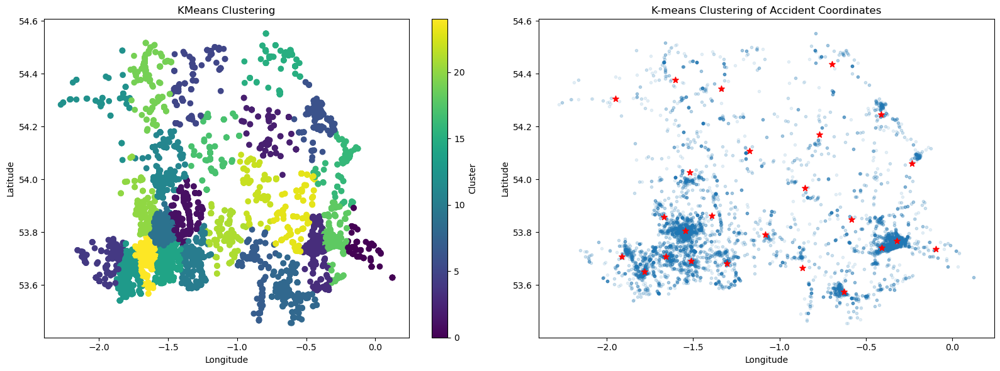

In [91]:
# Create a figure with two subplots arranged horizontally
fig26, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot the clusters using region_df on the first subplot (ax_1)
scatter_1 = ax_1.scatter(region_df['longitude'], region_df['latitude'], c=region_df['cluster'], cmap='viridis')
ax_1.set_xlabel('Longitude')
ax_1.set_ylabel('Latitude')
ax_1.set_title('KMeans Clustering')

# Add colorbar for the first subplot
colorbar_1 = fig26.colorbar(scatter_1, ax=ax_1, label='Cluster')

# Plot the clusters using X and kmeans.cluster_centers_ on the second subplot (ax_2)
scatter_2 = ax_2.scatter(X['longitude'], X['latitude'], alpha=0.1, marker='.')
for cluster in set(clusters):
    centroid = kmeans.cluster_centers_[cluster]
    ax_2.scatter(centroid[0], centroid[1], marker='*', color='red', s=50) 

ax_2.set_title('K-means Clustering of Accident Coordinates')
ax_2.set_xlabel('Longitude')
ax_2.set_ylabel('Latitude')

# Show the plots
plt.tight_layout()
plt.show()

In [92]:
# Create a Folium map centered around the UK
uk_map = folium.Map(location=[54.5, -3.0], zoom_start=6)

# Plot the cluster centers on the Folium map
for cluster in set(clusters):
    centroid = kmeans.cluster_centers_[cluster]
    folium.Marker(location=[centroid[1], centroid[0]], icon=folium.Icon(color='red')).add_to(uk_map)

# Display the map
uk_map.save('cluster_centers_map.html')

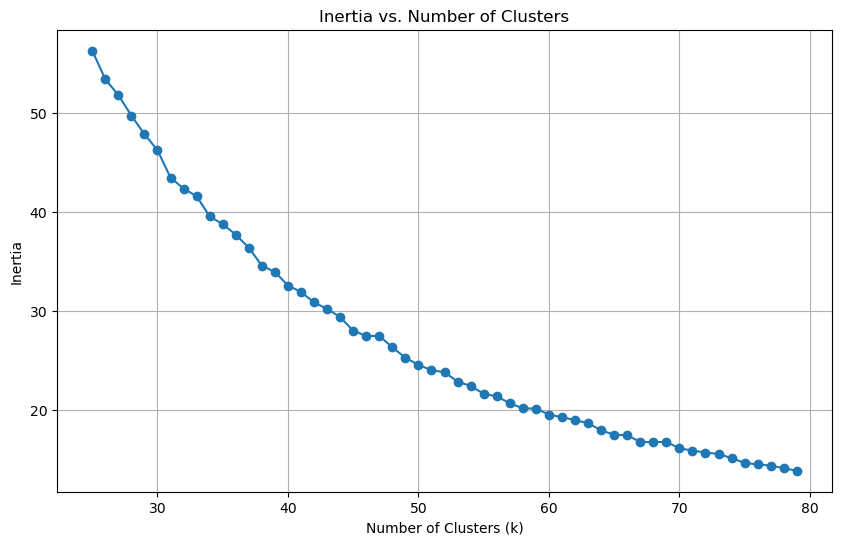

In [93]:
# Calculate inertia for different values of n_clusters
inertia_values = []
for k in range(25, 80):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

# Plot the inertia values against the number of clusters
fig27, ax27 = plt.subplots(figsize=(10, 6))
ax27.plot(range(25, 80), inertia_values, marker='o')
ax27.set_title('Inertia vs. Number of Clusters')
ax27.set_xlabel('Number of Clusters (k)')
ax27.set_ylabel('Inertia')
ax27.grid(True)
plt.show()

In [94]:
# Determine the optimal number of clusters based on the inertia plot (elbow method)
optimal_n_clusters = 5

# Perform K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)

# Initialize a map centered around the average latitude and longitude
center_lat = region_df['latitude'].mean()
center_lon = region_df['longitude'].mean()
m_location = folium.Map(location=[center_lat, center_lon], zoom_start=10)

# Add markers for each accident location colored by cluster
for index, row in region_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        fill=True,
        fill_opacity=0.2
    ).add_to(m_location)

# Display the map
m_location

In [97]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Define DBSCAN parameters
eps = 0.1  # Maximum distance between two samples
min_samples = 5  # Minimum number of samples in a neighborhood

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(X)
cluster_labels = dbscan.labels_

# Add the cluster labels to the DataFrame
region_df['cluster_dbscan'] = cluster_labels

# Print the unique cluster labels
print("Unique cluster labels:", set(cluster_labels))

Unique cluster labels: {0, -1}


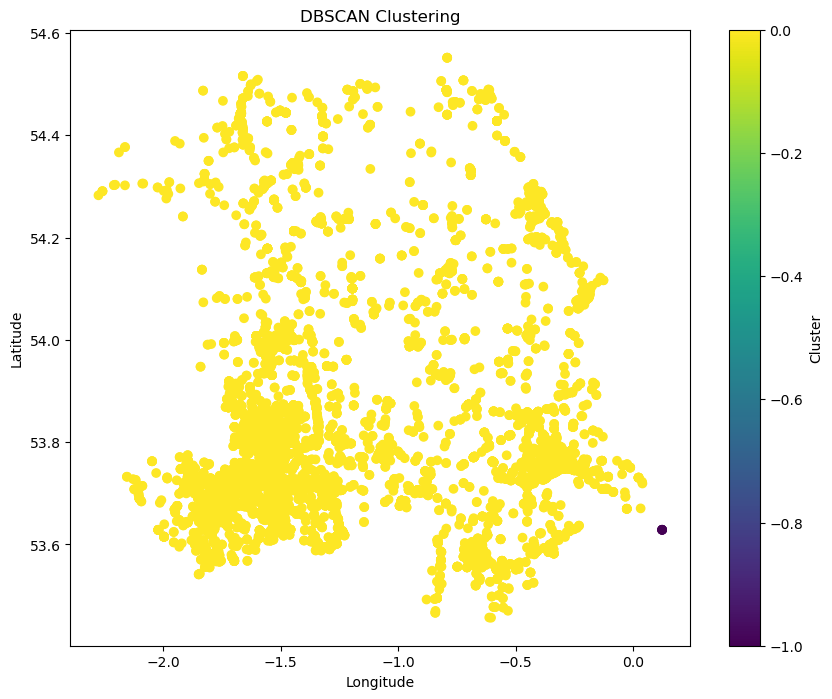

In [98]:
# Assign cluster labels
region_df['dbscan_cluster'] = dbscan.labels_

# Plot the clusters
fig28, ax28 = plt.subplots(figsize=(10, 8))
scatter = ax28.scatter(region_df['longitude'], region_df['latitude'], c=region_df['dbscan_cluster'], cmap='viridis')
ax28.set_xlabel('Longitude')
ax28.set_ylabel('Latitude')
ax28.set_title('DBSCAN Clustering')
plt.colorbar(scatter, label='Cluster', ax=ax28)
plt.show()

In [99]:
# Filter out non-numeric columns
numeric_columns = region_df.select_dtypes(include=['float64', 'int64'])

# Analyze the characteristics of each cluster
cluster_analysis = region_df.groupby('dbscan_cluster')[numeric_columns.columns].mean()
cluster_analysis

,junction_detail,number_of_casualties,age_of_casualty,light_conditions,urban_or_rural_area,weather_conditions,road_surface_conditions,age_of_driver,age_of_vehicle,number_of_vehicles,sex_of_driver,vehicle_type,road_type,location_easting_osgr,location_northing_osgr,longitude,latitude,cluster_dbscan,dbscan_cluster
dbscan_cluster,,,,,,,,,,,,,,,,,,,
-1,0.000000,2.000000,47.000000,1.000000,2.000000,1.000000,1.000000,49.500000,7.500000,2.000000,1.000000,9.000000,6.000000,540544.000000,416765.000000,0.123813,53.628577,-1.0,-1.0
0,2.042879,1.825207,37.231355,1.908653,1.420119,1.378011,1.296011,39.661495,7.439487,2.180189,1.420601,10.308441,5.222104,456029.662266,436013.148584,-1.150318,53.816098,0.0,0.0


In [100]:
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.cluster import cluster_visualizer
from pyclustering.utils import read_sample

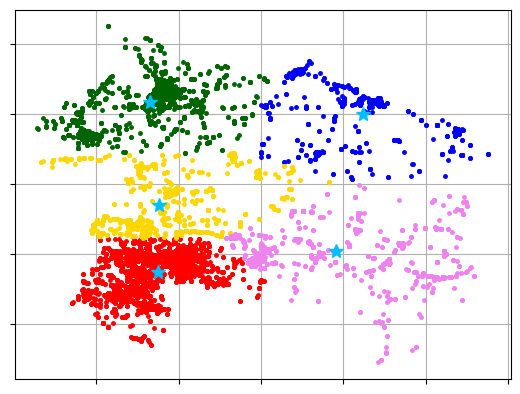

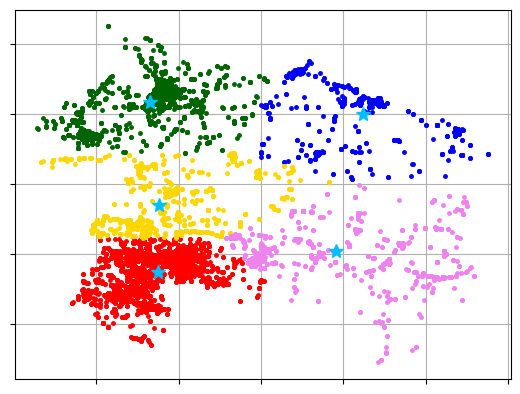

In [101]:
# Convert DataFrame to list of coordinates
coordinates = region_df[['latitude', 'longitude']].values.tolist()

# Initialize K-medoids algorithm
initial_medoids = [0, 1, 2, 3, 4]  # You can choose initial medoids randomly or based on some criterion
kmedoids_instance = kmedoids(coordinates, initial_medoids)

# Run K-medoids algorithm
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
medoids = kmedoids_instance.get_medoids()

# Visualize clusters and medoids
visualizer = cluster_visualizer()
visualizer.append_clusters(clusters, coordinates)
visualizer.append_cluster(medoids, data=coordinates, marker='*', markersize=10)
visualizer.show()

### 6

#### Outlier Detection Methods

##### Exercise 1: Multiple of Interquartile Range (IQR) method

1. Make histograms of the age_of_driver and age_of_vehicle columns of the vehicle
table. Do you spot anything that could indicate bad values? For now, you can
forward fill any bad values – but you should try to do something more sophisticated
for the report.
2. Using the lecture slides as a reference if you need to, implement a function which
returns the upper quartile + 1.5*IQR and lower quartile – 1.5*IQR of a Pandas Series
or a given column of a Dataframe.
3. Apply this function to the age_of_driver and age_of_vehicle columns in the vehicle
data frame to find the limits beyond which you would expect outliers.
4. Look at the values outside of this range. These are the detected outliers. Do you
think they are real outliers? Should you keep them in the data? Do any of the other
columns help you in this decision? Whatever you do – document it.
5. What are the limitations of applying this method to the data?

In [102]:
from sklearn.ensemble import IsolationForest

In [103]:
# Define the columns you want to analyze
columns_of_interest = ['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'age_of_casualty',
                       'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'speed_limit']

In [104]:
def detect_outliers_iqr(data, columns_of_interest, threshold=1.5):
    # Subset the DataFrame to include only the columns of interest
    data_subset = data[columns_of_interest]
    
    # Define the threshold for identifying outliers based on IQR
    q1 = data_subset.quantile(0.25)
    q3 = data_subset.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    
    # Identify outliers using IQR
    outliers_iqr = ((data_subset < lower_bound) | (data_subset > upper_bound)).any(axis=1)
    
    return outliers_iqr

# Detect outliers using IQR
outliers_iqr = detect_outliers_iqr(combined_df, columns_of_interest)

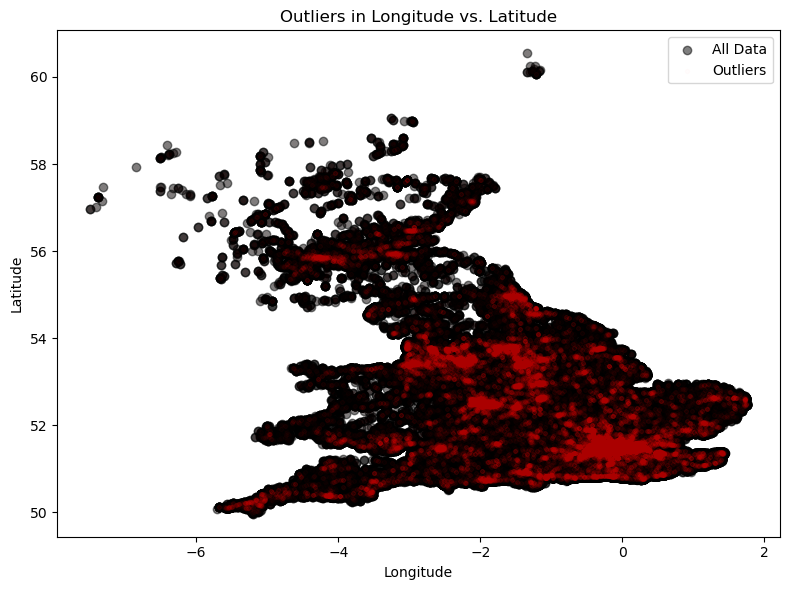

In [105]:
# Initialize the figure and subplot
fig29, ax29 = plt.subplots(figsize=(8, 6))

# Scatter plot for all data points
scatter_all = ax29.scatter(combined_df['longitude'], combined_df['latitude'], alpha=0.5, color='black', label='All Data')

# Scatter plot for outliers (red color, different marker)
scatter_outliers = ax29.scatter(combined_df.loc[outliers_iqr, 'longitude'], 
                                combined_df.loc[outliers_iqr, 'latitude'], 
                                color='red', alpha=0.01, marker='.', label='Outliers')

# Add legend and labels
ax29.legend()
ax29.set_title('Outliers in Longitude vs. Latitude')
ax29.set_xlabel('Longitude')
ax29.set_ylabel('Latitude')

# Show the plot
plt.tight_layout()
plt.show()

In [106]:
def detect_outliers_isolation_forest(data, columns_of_interest, contamination=0.1):
    # Subset the DataFrame to include only the columns of interest
    data_subset = data[columns_of_interest]
    
    # Initialize and fit the Isolation Forest model
    model = IsolationForest(contamination=contamination)
    model.fit(data_subset)
    
    # Predict outliers using Isolation Forest
    outliers_isolation_forest = model.predict(data_subset) == -1
    
    return outliers_isolation_forest

# Detect outliers using Isolation Forest
outliers_isolation_forest = detect_outliers_isolation_forest(combined_df, columns_of_interest)

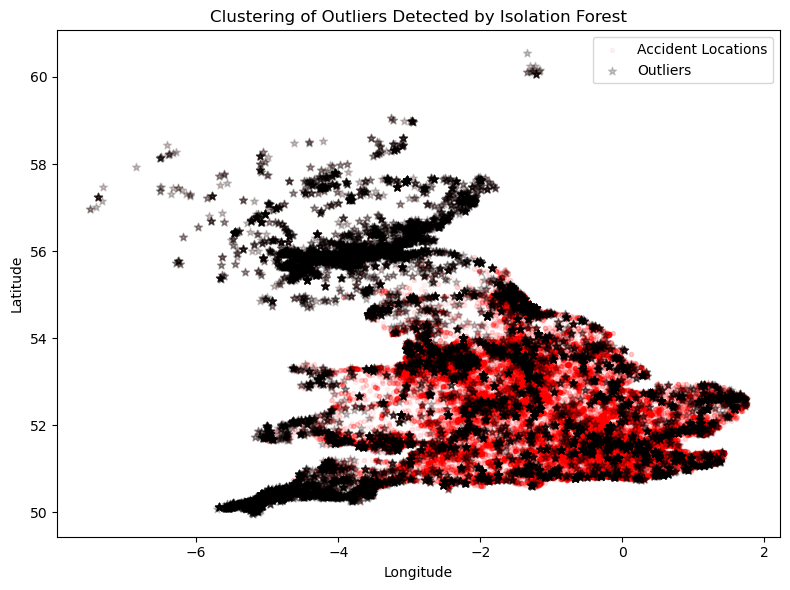

In [107]:
# Initialize the figure and subplots
fig30, ax30 = plt.subplots(figsize=(8, 6))

# Plot the accident locations in black
scatter_accidents = ax30.scatter(combined_df['longitude'], combined_df['latitude'], alpha=0.05, color='red', marker='.', label='Accident Locations')

# Plot outliers in red
scatter_outliers = ax30.scatter(combined_df.loc[outliers_isolation_forest, 'longitude'], 
                                combined_df.loc[outliers_isolation_forest, 'latitude'], 
                                color='black', alpha=0.2, label='Outliers', marker='*')

# Add legend
ax30.legend()

# Set titles and labels
ax30.set_title('Clustering of Outliers Detected by Isolation Forest')
ax30.set_xlabel('Longitude')
ax30.set_ylabel('Latitude')

# Show the plot
plt.tight_layout()
plt.show()

Result Interpretation:

The calculated IQR is 27.0.
Using a multiplier of 1.5, the lower bound for detecting outliers is -18.5 and the upper bound is 89.5.
Using a multiplier of 3, the lower bound for detecting outliers is -59.0 and the upper bound is 130.0.

Usage:

These bounds can be used to identify potential outliers in the 'age_of_driver' column of the filt_vehicle dataframe. Any value below the lower bound or above the upper bound can be considered as an outlier according to the IQR method.
Outliers can be further investigated to determine if they are erroneous data points or valid observations with extreme values. Depending on the context, outliers can be handled by removing them, replacing them with more appropriate values, or analyzing them separately.

#### 7. 
Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

Target Variable: Target column based on the 'accident_severity' based on fatal. 

Numeric Features: 'age_of_driver', 'speed_limit', 'number_of_vehicles', number_of_casualties, age_of_vehicle, engine_capacity_cc, age_of_casualty  are numeric features that could potentially provide valuable information for predicting accident severity.

Categorical Features: 'day_of_week', 'light_conditions', 'weather_conditions', road_type,  junction_detail,  road_surface_conditions, urban_or_rural_area, sex_of_driver, sex_of_casualty, pedestrian_location, pedestrian_movement, pedestrian_crossing_human_control, pedestrian_crossing_physical_facilities, casualty_class are categorical features that may also play a significant role in predicting accident severity.

Geospatial Features:'latitude', 'longitude', 'location_easting_osgr', 'location_northing_osgr' could be useful for geospatial analysis or for deriving additional features such as distance to certain locations.

Temporal Features: Columns like 'day_of_week', 'hour' may contain temporal information that could be relevant for predicting accident severity.

In [119]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, f1_score, recall_score
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score, confusion_matrix, precision_recall_fscore_support

In [109]:
# Define selected features
selected_features = ['age_of_driver', 'speed_limit', 'number_of_vehicles', 'number_of_casualties', 'age_of_vehicle',
                     'age_of_casualty', 'day_of_week', 'light_conditions', 'weather_conditions',
                     'road_type', 'junction_detail', 'road_surface_conditions', 'urban_or_rural_area', 'sex_of_driver',
                     'sex_of_casualty', 'pedestrian_location', 'pedestrian_movement', 'pedestrian_crossing_human_control',
                     'pedestrian_crossing_physical_facilities', 'casualty_class', 'hour']

In [112]:
# Separate features and target variable
X = combined_df[selected_features]
y = (combined_df['accident_severity'] == 1).astype(int)  # Convert to 0/1 for binary classification

# Instantiate the OneHotEncoder
encoder = OneHotEncoder()

# One-Hot encode categorical features (including target variable if needed)
categorical_cols = ['light_conditions', 'weather_conditions', 'road_type', 'junction_detail', 'road_surface_conditions',
                    'urban_or_rural_area', 'sex_of_driver','sex_of_casualty', 'pedestrian_location', 'pedestrian_movement',
                    'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'casualty_class']
numerical_cols = ['age_of_driver', 'speed_limit', 'number_of_vehicles', 'number_of_casualties', 'age_of_vehicle',
                    'age_of_casualty', 'day_of_week', 'hour']

# One-Hot encode categorical features
encoded_features = encoder.fit_transform(X[categorical_cols])

# Get the names of the one-hot encoded features
encoded_feature_names = encoder.get_feature_names_out(categorical_cols)

# Create a DataFrame from the encoded features
encoded_df = pd.DataFrame(encoded_features.toarray(), columns=encoded_feature_names)

# Combine encoded categorical features with numerical features
X_encoded = pd.concat([encoded_df, X[numerical_cols]], axis=1)

In [113]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler

# Balance the dataset using RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(X_encoded, y)

# Normalize the features using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled)

In [114]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

#### Logistic Regression

In [115]:
from sklearn.linear_model import LogisticRegression

# Standardize the numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the logistic regression model
logistic_regression = LogisticRegression()

# Train the model
logistic_regression.fit(X_train_scaled, y_train)

LogisticRegression()

In [116]:
# Predict on the test set
y_pred = logistic_regression.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Accuracy: 0.7566450088600118
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.74      0.75       838
           1       0.75      0.77      0.76       855

    accuracy                           0.76      1693
   macro avg       0.76      0.76      0.76      1693
weighted avg       0.76      0.76      0.76      1693



In [120]:
# Predict on the test data
y_pred_logistic_regression = logistic_regression.predict(X_test_scaled)

# Compute evaluation metrics
accuracy_logistic_regression = accuracy_score(y_test, y_pred_logistic_regression)
precision_logistic_regression = precision_score(y_test, y_pred_logistic_regression)
recall_logistic_regression = recall_score(y_test, y_pred_logistic_regression)
f1_logistic_regression = f1_score(y_test, y_pred_logistic_regression)
roc_auc_logistic_regression = roc_auc_score(y_test, y_pred_logistic_regression)

# Print the evaluation metrics
print("Accuracy:", accuracy_logistic_regression)
print("Precision:", precision_logistic_regression)
print("Recall:", recall_logistic_regression)
print("F1 Score:", f1_logistic_regression)
print("ROC AUC Score:", roc_auc_logistic_regression)

Accuracy: 0.7566450088600118
Precision: 0.7519908987485779
Recall: 0.7730994152046784
F1 Score: 0.7623990772779701
ROC AUC Score: 0.7564781085569932


In [121]:
# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_logistic_regression)

print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[620 218]
 [194 661]]


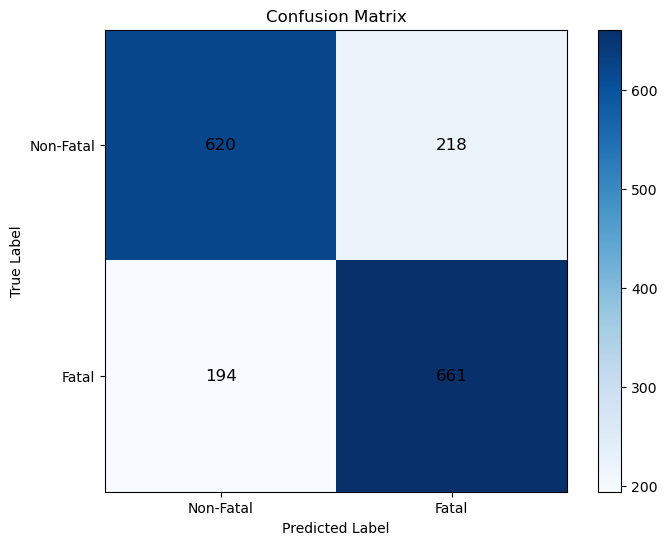

In [122]:
# Create the confusion matrix plot
fig31, ax31 = plt.subplots(figsize=(8, 6))
im = ax31.imshow(conf_matrix, cmap='Blues')
cbar = ax31.figure.colorbar(im, ax=ax31)
ax31.set_title('Confusion Matrix')
ax31.set_ylabel('True Label')
ax31.set_xlabel('Predicted Label')
ax31.set_xticks([0, 1])
ax31.set_yticks([0, 1])
ax31.set_xticklabels(['Non-Fatal', 'Fatal'])  # Adjust tick labels for predicted labels
ax31.set_yticklabels(['Non-Fatal', 'Fatal'])  # Adjust tick labels for true labels

# Annotate with counts
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax31.text(j, i, conf_matrix[i, j], ha='center', va='center', fontsize=12)

plt.show()

#####  Gradient boosting model

In [123]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize the Gradient Boosting Classifier
gradient_boosting = GradientBoostingClassifier(random_state=42)

# Fit the model on the training data
gradient_boosting.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [124]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
# Predict on the test data
y_pred_gradient_boosting = gradient_boosting.predict(X_test)

# Compute evaluation metrics
accuracy_gradient_boosting = accuracy_score(y_test, y_pred_gradient_boosting)
precision_gradient_boosting = precision_score(y_test, y_pred_gradient_boosting)
recall_gradient_boosting = recall_score(y_test, y_pred_gradient_boosting)
f1_gradient_boosting = f1_score(y_test, y_pred_gradient_boosting)
roc_auc_gradient_boosting = roc_auc_score(y_test, y_pred_gradient_boosting)
# Print the evaluation metrics
print("Accuracy:", accuracy_gradient_boosting)
print("Precision:", precision_gradient_boosting)
print("Recall:", recall_gradient_boosting)
print("F1 Score:", f1_gradient_boosting)
print("ROC AUC Score:", roc_auc_gradient_boosting)

Accuracy: 0.7678676904902539
Precision: 0.7730496453900709
Recall: 0.7649122807017544
F1 Score: 0.7689594356261023
ROC AUC Score: 0.7678976677971779


In [125]:
report = classification_report(y_test, y_pred_gradient_boosting)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.77      0.77       838
           1       0.77      0.76      0.77       855

    accuracy                           0.77      1693
   macro avg       0.77      0.77      0.77      1693
weighted avg       0.77      0.77      0.77      1693



In [126]:
conf_matrix = confusion_matrix(y_test, y_pred_gradient_boosting)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[646 192]
 [201 654]]


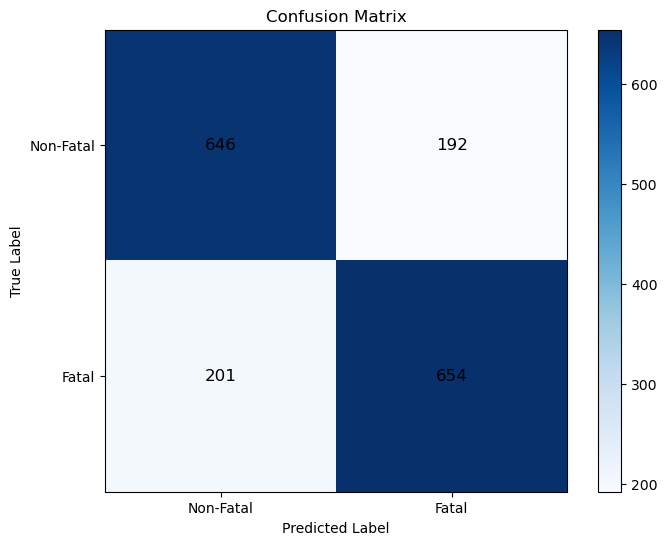

In [127]:
# Create the confusion matrix plot
fig32, ax32 = plt.subplots(figsize=(8, 6))
im = ax32.imshow(conf_matrix, cmap='Blues')
cbar = ax32.figure.colorbar(im, ax=ax32)
ax32.set_title('Confusion Matrix')
ax32.set_ylabel('True Label')
ax32.set_xlabel('Predicted Label')
ax32.set_xticks([0, 1])
ax32.set_yticks([0, 1])
ax32.set_xticklabels(['Non-Fatal', 'Fatal'])
ax32.set_yticklabels(['Non-Fatal', 'Fatal'])

# Annotate with counts
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax32.text(j, i, conf_matrix[i, j], ha='center', va='center', fontsize=12)

plt.show()

##### Random Forest

In [145]:
# Initialize the Random Forest Classifier
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Predict on the test data
y_pred_random_forest = random_forest.predict(X_test)

In [146]:
# Compute evaluation metrics
accuracy_random_forest = accuracy_score(y_test, y_pred_random_forest)
precision_random_forest = precision_score(y_test, y_pred_random_forest)
recall_random_forest = recall_score(y_test, y_pred_random_forest)
f1_random_forest = f1_score(y_test, y_pred_random_forest)
roc_auc_random_forest = roc_auc_score(y_test, y_pred_random_forest)
# Print the evaluation metrics
print("Accuracy:", accuracy_random_forest)
print("Precision:", precision_random_forest)
print("Recall:", recall_random_forest)
print("F1 Score:", f1_random_forest)
print("ROC AUC Score:", roc_auc_random_forest)

Accuracy: 0.8310691080921441
Precision: 0.8236632536973834
Recall: 0.8467836257309942
F1 Score: 0.8350634371395618
ROC AUC Score: 0.8309097126268337


In [147]:
report = classification_report(y_test, y_pred_random_forest)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.82      0.83       838
           1       0.82      0.85      0.84       855

    accuracy                           0.83      1693
   macro avg       0.83      0.83      0.83      1693
weighted avg       0.83      0.83      0.83      1693



In [148]:
conf_matrix = confusion_matrix(y_test, y_pred_random_forest)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[683 155]
 [131 724]]


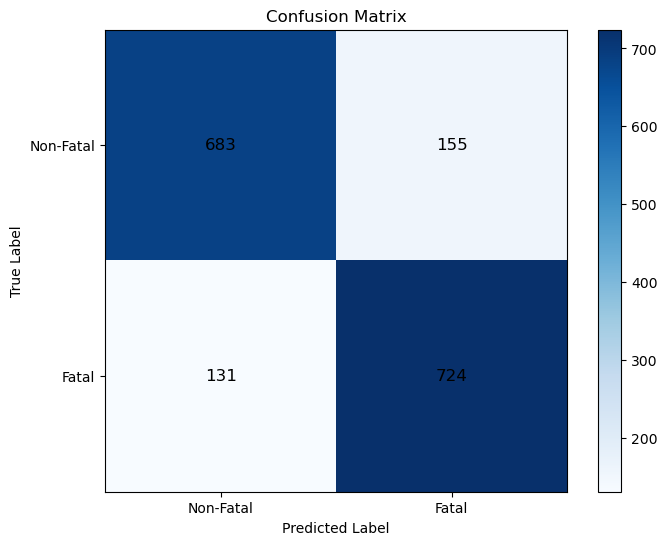

In [149]:
# Create the confusion matrix plot
fig33, ax33 = plt.subplots(figsize=(8, 6))
im = ax33.imshow(conf_matrix, cmap='Blues')
cbar = ax33.figure.colorbar(im, ax=ax33)
ax33.set_title('Confusion Matrix')
ax33.set_ylabel('True Label')
ax33.set_xlabel('Predicted Label')
ax33.set_xticks([0, 1])
ax33.set_yticks([0, 1])
ax33.set_xticklabels(['Non-Fatal', 'Fatal'])
ax33.set_yticklabels(['Non-Fatal', 'Fatal'])

# Annotate with counts
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax33.text(j, i, conf_matrix[i, j], ha='center', va='center', fontsize=12)

plt.show()

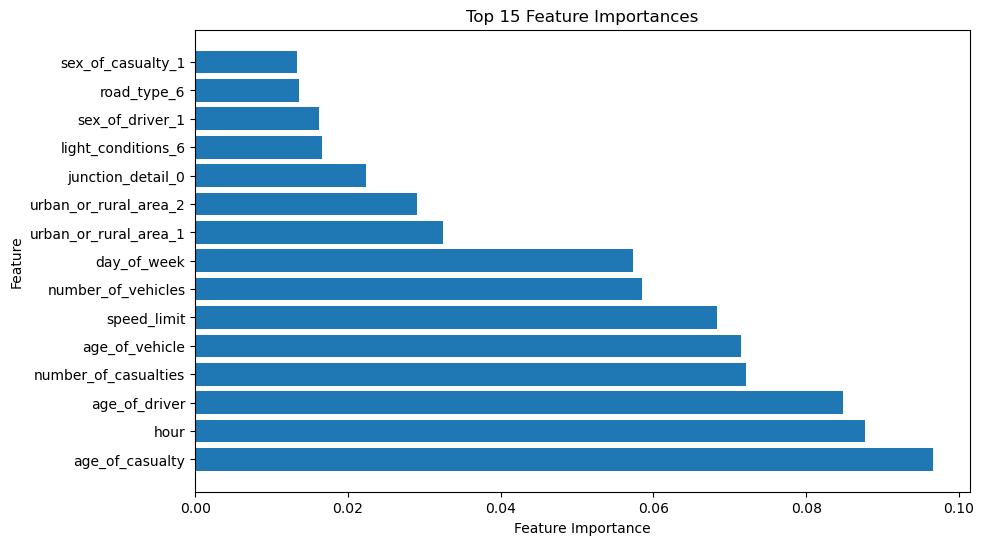

In [150]:
# Extract feature importances
feature_importances = random_forest.feature_importances_

# Get feature names
feature_names = X_train.columns

# Sort feature importances in descending order
indices = np.argsort(feature_importances)[::-1]

# Number of top features to select
top_n = 15

# Select the top N features
top_features = feature_names[indices][:top_n]
top_importances = feature_importances[indices][:top_n]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), top_importances, align='center')
plt.yticks(range(top_n), top_features)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top {} Feature Importances'.format(top_n))
plt.show()


In [151]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the Random Forest Classifier
random_forest = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=random_forest, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [152]:
# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Use the best estimator to predict on the test data
best_estimator = grid_search.best_estimator_
y_pred_random_forest_grid = best_estimator.predict(X_test)

In [153]:
# Print the best parameters and best score
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Score: 0.8224235000507651


In [154]:
# Compute evaluation metrics
accuracy_random_forest_grid = accuracy_score(y_test, y_pred_random_forest_grid)
precision_random_forest_grid = precision_score(y_test, y_pred_random_forest_grid)
recall_random_forest_grid = recall_score(y_test, y_pred_random_forest_grid)
f1_random_forest_grid = f1_score(y_test, y_pred_random_forest_grid)
roc_auc_random_forest_grid = roc_auc_score(y_test, y_pred_random_forest_grid)
# Print the evaluation metrics
print("Accuracy:", accuracy_random_forest_grid)
print("Precision:", precision_random_forest_grid)
print("Recall:", recall_random_forest_grid)
print("F1 Score:", f1_random_forest_grid)
print("ROC AUC Score:", roc_auc_random_forest_grid)

Accuracy: 0.8310691080921441
Precision: 0.8236632536973834
Recall: 0.8467836257309942
F1 Score: 0.8350634371395618
ROC AUC Score: 0.8309097126268337


In [155]:
report = classification_report(y_test, y_pred_random_forest_grid)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.82      0.83       838
           1       0.82      0.85      0.84       855

    accuracy                           0.83      1693
   macro avg       0.83      0.83      0.83      1693
weighted avg       0.83      0.83      0.83      1693



In [156]:
conf_matrix = confusion_matrix(y_test, y_pred_random_forest_grid)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[683 155]
 [131 724]]


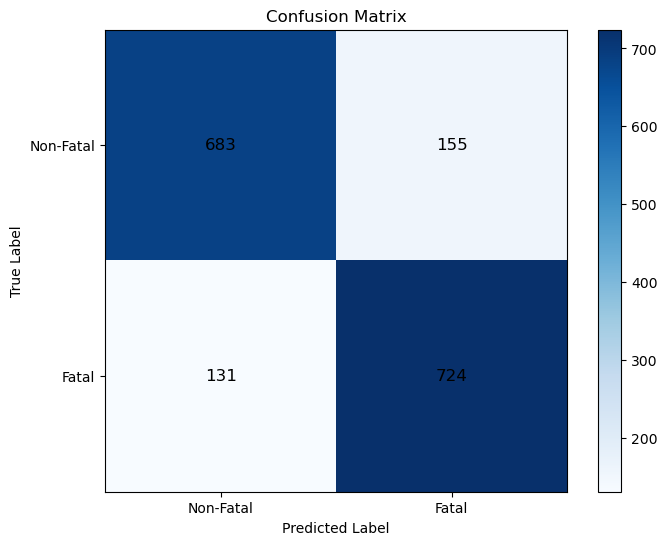

In [157]:
# Create the confusion matrix plot
fig34, ax34 = plt.subplots(figsize=(8, 6))
im = ax34.imshow(conf_matrix, cmap='Blues')
cbar = ax34.figure.colorbar(im, ax=ax34)
ax34.set_title('Confusion Matrix')
ax34.set_ylabel('True Label')
ax34.set_xlabel('Predicted Label')
ax34.set_xticks([0, 1])
ax34.set_yticks([0, 1])
ax34.set_xticklabels(['Non-Fatal', 'Fatal'])
ax34.set_yticklabels(['Non-Fatal', 'Fatal'])

# Annotate with counts
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax34.text(j, i, conf_matrix[i, j], ha='center', va='center', fontsize=12)

plt.show()

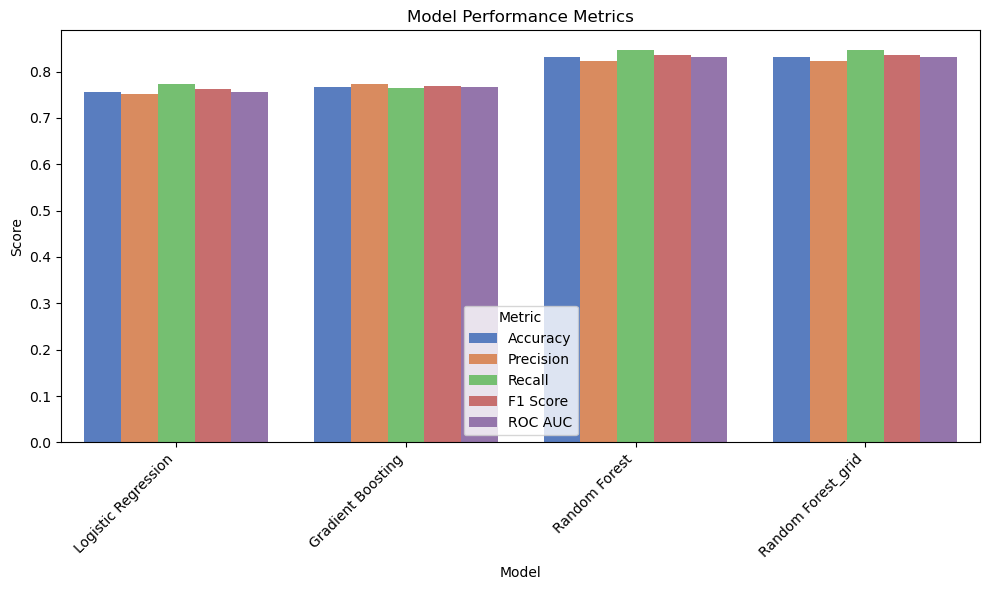

In [158]:
# Define the scores for each model
scores = {
    "Model": ["Logistic Regression", "Gradient Boosting", "Random Forest", 'Random Forest_grid'],
    "Accuracy": [accuracy_logistic_regression, accuracy_gradient_boosting, accuracy_random_forest, accuracy_random_forest_grid],
    "Precision": [precision_logistic_regression, precision_gradient_boosting, precision_random_forest, precision_random_forest_grid],
    "Recall": [recall_logistic_regression, recall_gradient_boosting, recall_random_forest, recall_random_forest_grid],
    "F1 Score": [f1_logistic_regression, f1_gradient_boosting, f1_random_forest, f1_random_forest_grid],
    "ROC AUC": [roc_auc_logistic_regression, roc_auc_gradient_boosting, roc_auc_random_forest, roc_auc_random_forest_grid ]
}

# Create a DataFrame from the scores
scores_df = pd.DataFrame(scores)

# Melt the DataFrame to long format for plotting
scores_df_melted = scores_df.melt(id_vars=["Model"], var_name="Metric", value_name="Score")

# Plot the clustered bar chart
fig35, ax35 = plt.subplots(figsize=(10, 6))
sns.barplot(data=scores_df_melted, x="Model", y="Score", hue="Metric", palette="muted", ax=ax35)
ax35.set_title("Model Performance Metrics")
ax35.set_ylabel("Score")
ax35.set_xlabel("Model")
ax35.legend(title="Metric")
ax35.set_xticklabels(ax35.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()